# Analysis of a single organoid recording

Organoids are recorded continuously for 2-3 weeks, resulting in large datasets. To analyze this data, we divided the recording into 3 groups:
1. `Recording start:` The first two-days of recording (after 1-hour boundary) to capture baseline activity.
    - We will analyze 8 5-minute frames during this period.
2. `Recording end:` The last two-days of recording (before 1-hour boundary) to capture activity after chronic recordings.
    - We will analyze 8 5-minute frames during this period.
3. `Drug response:` The 4-hours of recording after drug application (15-minute boundary) to capture acute drug response. Drugs are applied directly after the recording end period. 
    - We will analyze 2 5-minute frames for each of the following drugs:
       - `4-AP` (Will be compared relative to recording end)
       - `Normal Media` (Let organoids recover overnight)
       - `Bicuculline` (Will be compared relative to normal media)
       - `Tetrodotoxin (TTX)` (Applied directly after bicuculline)

Based on these groups, for single organoid analysis, we will be investigating two central questions:
1. **How does the organoid's activity change across the entire longitudinal recording?** 
    - We will analyze the baseline activity during the recording start period and compare it to the recording end period to understand how the organoid's activity changes over time.
2. **How does the organoid respond to drug application?**
    - We will analyze the drug response period to understand how the organoid's activity changes in response to the drug application, and compare it to the baseline activity (recording end).

In [1]:
import os
if os.path.basename(os.getcwd()) == "notebooks":
    os.chdir("..")

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal, stats
from datetime import datetime, timedelta
import datajoint as dj
from scipy.ndimage import gaussian_filter
import bottleneck as bn
from matplotlib.colors import LogNorm
from matplotlib.patches import Patch
import plotly.io as pio

c:\Users\Organoid PC\anaconda3\envs\utah_organoids\lib\site-packages\datajoint\plugin.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


In [3]:
import openpyxl

In [4]:
dj.config.load("dj_local_conf_worker.json")
dj.conn()

[2026-04-27 11:28:57,375][INFO]: DataJoint is configured from c:\Users\Organoid PC\Documents\GitHub\utah_organoids\dj_local_conf_worker.json
[2026-04-27 11:28:57,748][INFO]: DataJoint 0.14.8 connected to utah-worker@db.datajoint.com:3306


DataJoint connection (connected) utah-worker@db.datajoint.com:3306

In [5]:
from element_array_ephys.ephys_no_curation import map_channel_to_electrode
from workflow.pipeline import frame, culture, ephys, analysis, mua, probe

Module stfio is not installed. Make sure .abf files are converted to .pkl in Python 2.


# 1. How does the organoid's activity change across the entire longitudinal recording?

Define groups for analysis:
- In this case, we are comparing the first 2 days to the last 2 days of recording. We will be splitting the processed data into groups based on this.
- To process the data, reference `CREATE_new_frame_session.ipynb` to see how we defined the frames for these groups and how we inserted the data into the database.

The sessions listed here will be the groups being compared in the analysis below

In [6]:
organoid_id = "O10"
drug_name = "Control"
frame_param_idx = 6

experiment_start_time = (culture.Experiment & f"organoid_id = '{organoid_id}'" & f"drug_name = '{drug_name}'").fetch1("experiment_start_time")

analysis_key = {
    "organoid_id": organoid_id,
    "experiment_start_time": experiment_start_time,
    "frame_param_idx": frame_param_idx
}

analysis_keys = (frame.FrameAnalysis & analysis_key).fetch("KEY", order_by="start_boundary")
frame.FrameAnalysis & analysis_keys

organoid_id e.g. O17,experiment_start_time,start_boundary Start datetime for analysis,end_boundary End datetime for analysis,frame_param_idx Reference to TimeFrameParamset,num_processed_sessions Number of sessions with available data within the analysis boundaries,num_available_files Number of available ephys files within the analysis boundaries
O10,2023-05-03 17:33:00,2023-05-03 18:33:00,2023-05-05 18:33:00,6,2880,2880
O10,2023-05-03 17:33:00,2023-05-16 11:15:00,2023-05-18 11:15:00,6,2820,2880


Define the names for the groups being compared in the analysis below

In [7]:
analysis_names = ["Start of Recording", "End of Recording"]

if len(analysis_keys) != len(analysis_names):
    raise ValueError("Number of analysis keys does not match number of analysis names. Please check the data and update the analysis names accordingly.")

Define the sessions for the groups being compared in the analysis below

In [8]:
session_dict = {}

for key, name in zip(analysis_keys, analysis_names):

    session_keys = (frame.FrameAnalysis.ActiveTimeFrames & key).fetch("KEY", order_by="frame_start")
    for session_key in session_keys:
        session_key["start_time"] = session_key.pop("frame_start")
        session_key["end_time"] = session_key.pop("frame_end")
        session_key = {
            **session_key,
            "insertion_number": 2
        }
    
    session_dict[name] = session_keys

    print(f"{name}: {len(ephys.EphysSession & session_keys)} sessions")

Start of Recording: 8 sessions
End of Recording: 8 sessions


Define colors for plotting the groups being compared in the analysis below

In [9]:
group_colors = {
    analysis_names[0]: "#40AD51",
    analysis_names[1]: "#A640AD"
}

session_colors = [
    "#F74F4F",
    "#F7AB4F",
    "#F7DE4F",
    "#79F74F",
    "#4FF7E1",
    "#4F9BF7",
    "#8D4FF7",
    "#F74FD8"
]

In [10]:
# get frequency band information
# get frequency bands
frequency_bands = {
    band['band_name']: (band['lower_freq'], band['upper_freq']) for band in analysis.SpectralBand.fetch(as_dict=True, order_by='lower_freq')
    }

band_colors = {
    "delta": "#ad2bea",
    "theta": "#4d3ff8",
    "alpha": "#39cabb",
    "beta": "#53e53a",
    "gamma": "#e3e12c",
    "highgamma1": "#f7a740",
    "highgamma2": "#ed3838",
}

In [11]:
num_elec_inside = (culture.OrganoidImplantationImage & f"organoid_id = '{organoid_id}'").fetch1("num_electrodes_inside")
num_groups = max([len(sessions) for sessions in session_dict.values()])

Check impedance values for each session

In [11]:
# Get electrode impedance data

# define impedance bounds
I1 = 50000 # Ohms
I2 = 2000000 # Ohms

# loop through sessions and extract impedance measurements
impedance_data = {}
for name, sessions in session_dict.items():
    impedance_data[name] = {}

    for session in sessions:
        start_time = session["start_time"]

        # fetch session_info
        session_info = (ephys.EphysSessionInfo & session).fetch1("session_info")
        
        # extract channel indices and impedance magnitudes
        port_id = (ephys.EphysSessionProbe & session).fetch1("port_id")
        channel_indices, impedance_magnitudes = np.array([(channel_dict["native_order"], channel_dict["electrode_impedance_magnitude"]) for channel_dict in session_info["amplifier_channels"] if channel_dict["port_name"] == f"Port {port_id}"]).T

        # map channel indices to electrodes
        electrodes = map_channel_to_electrode(input_indices = channel_indices.astype(int))
        impedance_magnitudes = impedance_magnitudes[electrodes]

        # store impedance data
        impedance_data[name][start_time] = impedance_magnitudes

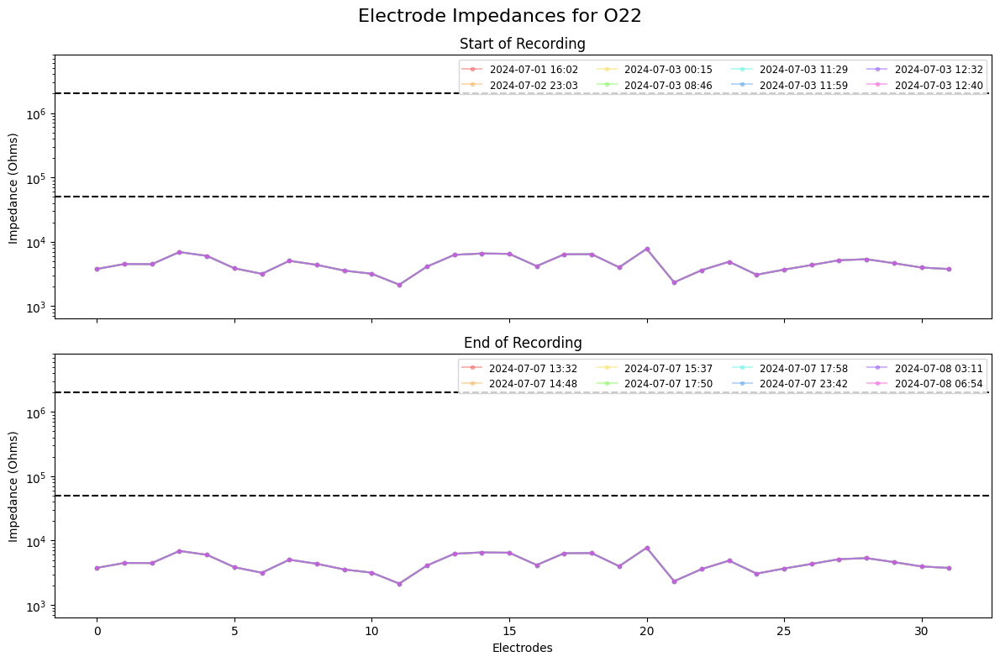

In [12]:
# Plot electrode impedances
# (num groups x 1) figure, electrodes on the x-axis, impedance on the y-axis, different color for each session, horizontal lines indicating impedance bounds, log y-scale

fig, axes = plt.subplots(len(session_dict), 1, figsize=(12, 4 * len(session_dict)), sharex=True, tight_layout=True)
fig.suptitle(f"Electrode Impedances for {organoid_id}", fontsize=16)

if len(session_dict) == 1:
    axes = [axes]

for i, (name, sessions) in enumerate(session_dict.items()):
    ax = axes[i]

    if len(sessions) == 0:
        continue
    
    for j, session in enumerate(sessions):

        impedance_values = impedance_data[name][session["start_time"]]
        label = session["start_time"].strftime("%Y-%m-%d %H:%M")

        ax.plot(np.arange(len(impedance_values)), impedance_values, color=session_colors[j], label=label, alpha=0.4, marker=".", linestyle="-")
    
    ax.axhline(I1, color="black", linestyle="--")
    ax.axhline(I2, color="black", linestyle="--")
    ax.set_yscale("log")
    ax.set_title(name)
    ax.set_ylabel("Impedance (Ohms)")
    ax.legend(loc="upper right", fontsize="small", ncol=int(np.ceil(len(sessions) / 2)))
    if i == len(session_dict) - 1:
        ax.set_xlabel("Electrodes")

# determine y-axis bounds
min_value = np.min([np.min(np.concatenate([impedance_data[name][session["start_time"]] for name, sessions in session_dict.items() for session in sessions])), I1])
max_value = np.max([np.max(np.concatenate([impedance_data[name][session["start_time"]] for name, sessions in session_dict.items() for session in sessions])), I2])
for ax in axes:
    ax.set_ylim([min_value * 0.3, max_value * 4])

plt.show()

## MUA Firing Rates

In [13]:
# Get summary firing rate data
channel_firing_rate_data = {}

# loop through sessions and extract MUA firing rates
for name, sessions in session_dict.items():

    if len(sessions) == 0:
        continue

    session_mua_keys = np.concatenate([(mua.MUASpikes & 
                                        f"start_time BETWEEN '{session['start_time']}' AND '{session['end_time']}'" & 
                                        f"organoid_id = '{session['organoid_id']}'").fetch("KEY") for session in sessions])
    
    channel_indices, channel_firing_rates = (mua.MUASpikes.Channel & session_mua_keys).fetch("channel_idx", "spike_rate")

    # remove electrodes outside of organoid
    electrode_indices = map_channel_to_electrode(input_indices = channel_indices.astype(int))

    mean_firing_rates = np.array([np.mean(channel_firing_rates[electrode_indices == elec]) for elec in range(num_elec_inside)])

    # store firing rates
    channel_firing_rate_data[name] = mean_firing_rates

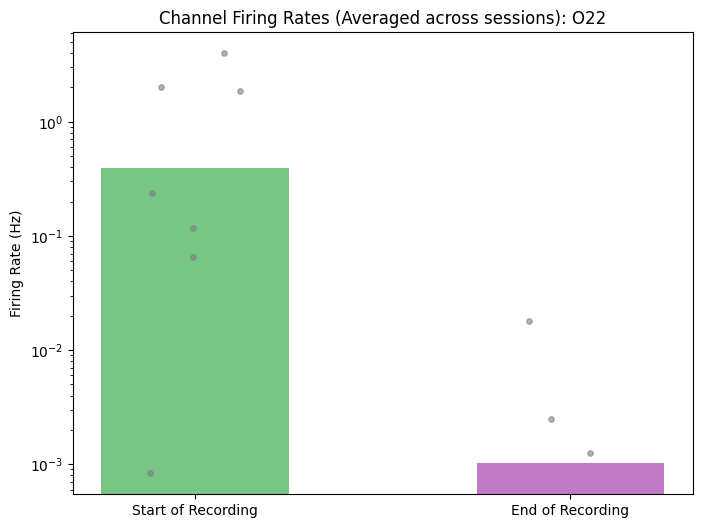

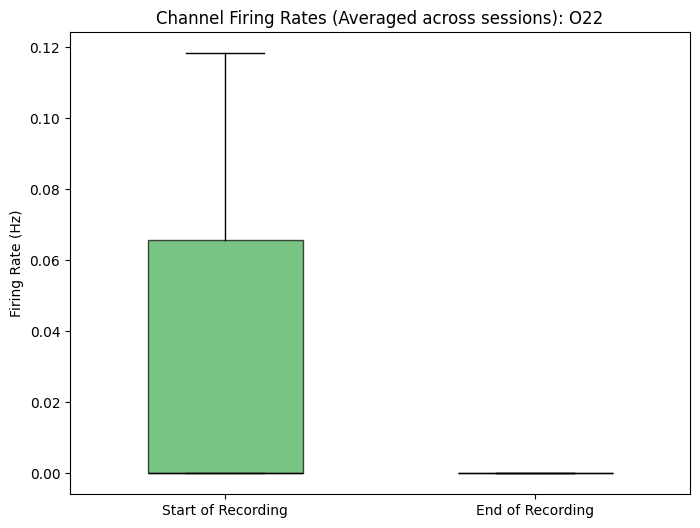

In [14]:
# Plot channel firing rates
# num group bar plot with each channel having a point (averaged across sessions)
fig, ax = plt.subplots(figsize=(8, 6))
bar_width = .5

for x, (name, firing_rates) in enumerate(channel_firing_rate_data.items()):
    ax.bar(x, np.mean(firing_rates), width=bar_width, color=group_colors[name], alpha=0.7)
    ax.scatter(x+(np.random.random(len(firing_rates))-.5)*(bar_width/2), firing_rates, s=60, color="grey", alpha=0.6, marker=".")

ax.set_title(f"Channel Firing Rates (Averaged across sessions): {organoid_id}")
ax.set_ylabel("Firing Rate (Hz)")
ax.set_xticks(np.arange(len(channel_firing_rate_data)))
ax.set_xticklabels(channel_firing_rate_data.keys())
ax.set_yscale("log")

plt.show()

# box and whisker plot (no fliers) of channel firing rates for each group
fig, ax = plt.subplots(figsize=(8, 6))
for x, (name, firing_rates) in enumerate(channel_firing_rate_data.items()):
    ax.boxplot(firing_rates, positions=[x], widths=0.5, patch_artist=True, boxprops=dict(facecolor=group_colors[name], alpha=0.7), medianprops=dict(color="black"), showfliers=False)


ax.set_title(f"Channel Firing Rates (Averaged across sessions): {organoid_id}")
ax.set_ylabel("Firing Rate (Hz)")
ax.set_xticklabels(channel_firing_rate_data.keys())

plt.show()

In [15]:
# Get time varying firing rates

firing_array_data = {}
dt = 10 # seconds
fs = 20e3 # Hz

for name, sessions in session_dict.items():

    firing_array_data[name] = {}
    for session in sessions:

        # get MUA keys for session
        session_mua_keys = (mua.MUASpikes & 
                            f"start_time BETWEEN '{session['start_time']}' AND '{session['end_time']-timedelta(seconds=1)}'" & 
                            f"organoid_id = '{session['organoid_id']}'").fetch("KEY")
        
        # get channel indices and spike times
        channel_indices, spike_indices, start_times = (mua.MUASpikes.Channel & session_mua_keys).fetch("channel_idx", "spike_indices", "start_time")
        electrode_indices = map_channel_to_electrode(input_indices = channel_indices.astype(int))

        # convert spike indices to spike times in seconds (relative to session start time)
        spike_times = (spike_indices / fs) + (start_times - session["start_time"]).astype("timedelta64[s]").astype(int)

        # create time bins
        time_bins = np.arange(0, (session['end_time']-session['start_time']).total_seconds()+dt, dt)

        # loop through channels and compute firing rates in each time bin
        session_firing_array = np.array([np.histogram(np.concatenate(spike_times[electrode_indices == elec]), bins=time_bins)[0] / dt for elec in range(num_elec_inside)])

        firing_array_data[name][f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"] = session_firing_array

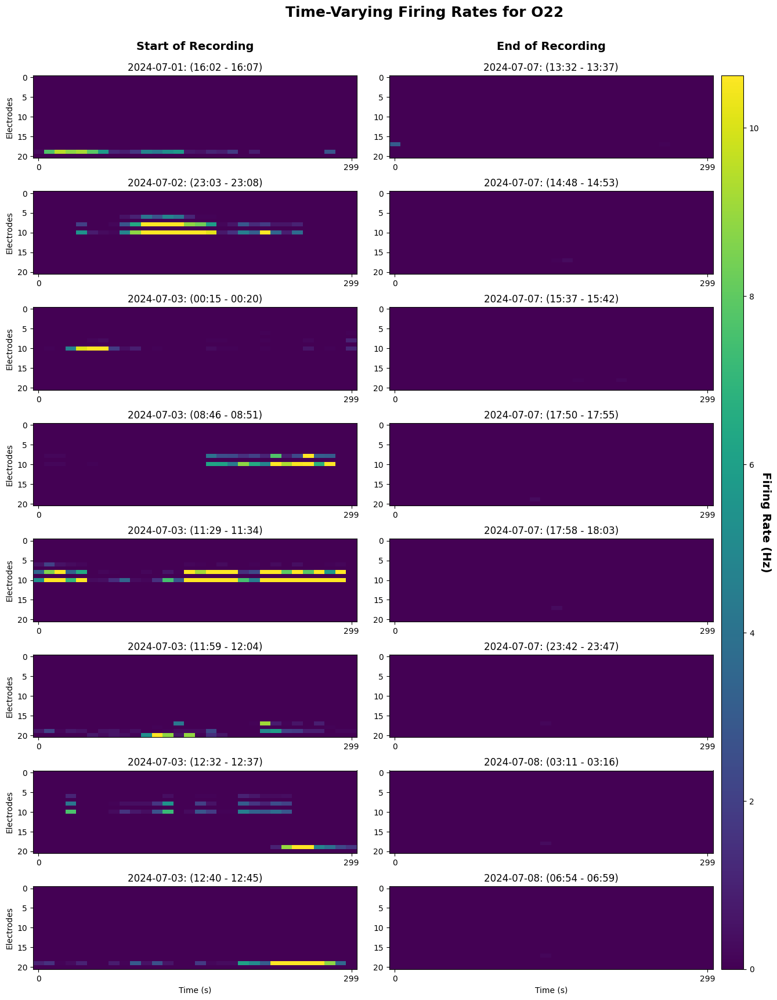

In [16]:
# Plot time varying firing rates
# (num_sessions x num_groups) figure, each subplot is one session, electrodes on y-axis, time on x-axis

num_groups = len(firing_array_data)
num_sessions = max(len(group_dict) for group_dict in firing_array_data.values())

fig, axs = plt.subplots(
    num_sessions,
    num_groups,
    figsize=(9 * num_groups, 2.5 * num_sessions),
    squeeze=False,
)
fig.subplots_adjust(wspace=0.1, hspace=0.4)
fig.suptitle(
    f"Time-Varying Firing Rates for {organoid_id}",
    fontsize=18,
    fontweight="bold",
    y=.94,
)

# define vmin and vmax for color scale based on percentiles of firing rates across all groups and sessions
all_firing_rates = np.concatenate([
    np.array(list(group_dict.values()))
    for group_dict in firing_array_data.values()
    if len(group_dict) > 0
], axis=0)
vmin, vmax = np.percentile(all_firing_rates, [0.5, 99.5])

num_xticks = 2
for group_idx, (group_name, group_dict) in enumerate(firing_array_data.items()):

    for session_idx, (session_name, firing_array) in enumerate(group_dict.items()):
        ax = axs[session_idx, group_idx]

        im = ax.imshow(firing_array, aspect="auto", cmap="viridis", vmin=vmin, vmax=vmax)

        session_info = session_dict[group_name][session_idx]
        session_duration = (session_info["end_time"] - session_info["start_time"]).total_seconds()
        xticks = np.linspace(0, firing_array.shape[1] - 1, num_xticks, dtype=int)
        ax.set_xticks(xticks)
        ax.set_xticklabels([f"{x:.0f}" for x in np.linspace(0, session_duration, num_xticks)])
        ax.set_title(session_name)

        if group_idx == 0:
            ax.set_ylabel("Electrodes")

        if session_idx == num_sessions - 1 and group_idx < len(group_dict):
            ax.set_xlabel("Time (s)")

# add global colorbar (spanning all subplots)
cbar = fig.colorbar(im, ax=axs, orientation="vertical", pad=.01, aspect=40)
cbar.set_label("Firing Rate (Hz)", rotation=270, labelpad=15, fontsize=14, fontweight="bold")

# Add one title centered above each column (one column per group)
for group_idx, group_name in enumerate(firing_array_data.keys()):
    col_axes = axs[:, group_idx]

    # column span in figure coordinates
    x0 = min(ax.get_position().x0 for ax in col_axes)
    x1 = max(ax.get_position().x1 for ax in col_axes)
    y1 = max(ax.get_position().y1 for ax in col_axes)

    # centered column title slightly above that column
    fig.text(
        (x0 + x1) / 2,
        y1 + 0.02,
        group_name,
        ha="center",
        va="bottom",
        fontsize=14,
        fontweight="bold",
    )

plt.show()

## MUA Population Bursts

In [17]:
import bottleneck as bn
from scipy.ndimage import gaussian_filter1d

In [18]:
# Get population burst trace data

burst_trace_data = {}
dt = 1 # ms
fs = 20e3 # Hz

# fetch population firing rate filtering parameters
gaus_len_ms, boxcar_len_ms = (mua.BurstDetectionParamset & "burst_param_idx = 1").fetch1("gaus_len_ms", "boxcar_len_ms")

for name, sessions in session_dict.items():

    burst_trace_data[name] = {}
    for session in sessions:

        # get MUA keys for session
        session_mua_keys = (mua.MUASpikes & 
                            f"start_time BETWEEN '{session['start_time']}' AND '{session['end_time']}'" & 
                            f"organoid_id = '{session['organoid_id']}'").fetch("KEY")
        
        # get channel indices and spike times
        channel_indices, spike_indices, start_times = (mua.MUASpikes.Channel & session_mua_keys).fetch("channel_idx", "spike_indices", "start_time")
        electrode_indices = map_channel_to_electrode(input_indices = channel_indices.astype(int))

        # fetch population burst data
        burst_indices, burst_bounds = (mua.PopulationBursts & session).fetch1("burst_indices", "burst_bounds")

        # convert spike indices to spike times in seconds (relative to session start time)
        spike_times = (spike_indices / fs * 1000) + (start_times - session["start_time"]).astype("timedelta64[ms]").astype(int)

        # create time bins
        time_bins = np.arange(0, 1000 * (session['end_time']-session['start_time']).total_seconds()+dt, dt)

        # compute population firing rate in each time bin
        session_firing_rate = 1000 * np.histogram(np.concatenate(spike_times[electrode_indices <= num_elec_inside]), bins=time_bins)[0] / dt
        session_firing_rate = bn.move_mean(session_firing_rate, window=boxcar_len_ms, min_count=1)

        # gaussian kernel 
        truncate = 4
        session_firing_rate = gaussian_filter1d(session_firing_rate, sigma=gaus_len_ms, truncate=truncate, mode="reflect")

        # get mask indicating a population burst
        burst_mask = np.zeros_like(session_firing_rate, dtype=bool)
        for burst_idx, burst_bound in zip(burst_indices, burst_bounds):
            
            burst_mask[burst_idx + np.arange(burst_bound[0], burst_bound[1])] = True

        # store population firing rate and burst mask
        burst_trace_data[name][f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"] = {
            "population_firing_rate": session_firing_rate,
            "burst_mask": burst_mask,
            "burst_peaks": burst_indices
        }

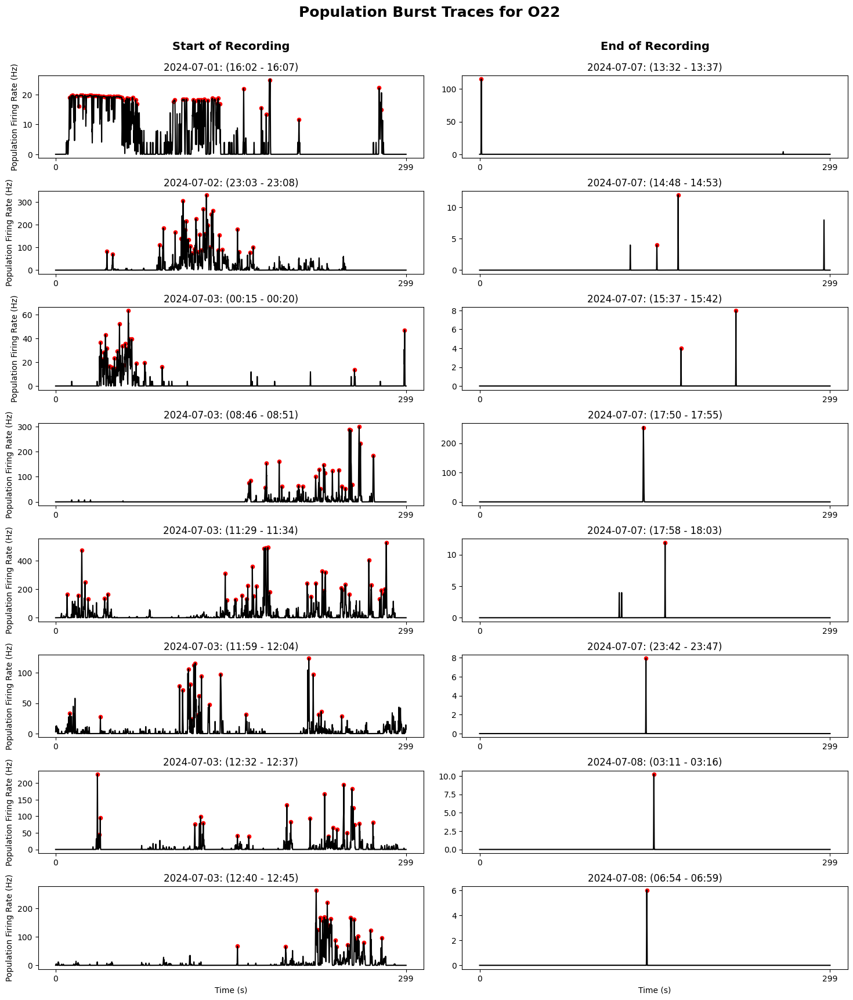

In [19]:
# Plot population burst traces
# (num_sessions x num_groups) figure, time on the x-axis, population firing rate on the y-axis, population bursts represented in red, burst peaks have a point

num_sessions = max(len(group_dict) for group_dict in burst_trace_data.values())

fig, axs = plt.subplots(
    num_sessions,
    num_groups,
    figsize=(9 * num_groups, 2.5 * num_sessions),
    squeeze=False,
)
fig.subplots_adjust(wspace=0.1, hspace=0.4)
fig.suptitle(
    f"Population Burst Traces for {organoid_id}",
    fontsize=18,
    fontweight="bold",
    y=.94
)

for group_idx, (group_name, group_dict) in enumerate(burst_trace_data.items()):

    for session_idx, (session_name, burst_data) in enumerate(group_dict.items()):
        ax = axs[session_idx, group_idx]

        time_axis = np.arange(len(burst_data["population_firing_rate"])) / 1000 * dt
        ax.plot(time_axis, burst_data["population_firing_rate"], color="black", label="Population Firing Rate")
        # ax.plot(time_axis[burst_data["burst_mask"]], burst_data["population_firing_rate"][burst_data["burst_mask"]], color="orange", s=10, label="Population Burst")
        ax.scatter(time_axis[burst_data["burst_peaks"]], burst_data["population_firing_rate"][burst_data["burst_peaks"]], color="red", s=20, label="Burst Peaks")

        session_duration = (session_dict[group_name][session_idx]['end_time'] - session_dict[group_name][session_idx]['start_time']).total_seconds()
        num_xticks = 2
        xticks = np.linspace(0, time_axis[-1], num_xticks)
        ax.set_xticks(xticks)
        ax.set_xticklabels([f"{(x):.0f}" for x in np.linspace(0, session_duration, num_xticks)])
        ax.set_title(session_name)

        if group_idx == 0:
            ax.set_ylabel("Population Firing Rate (Hz)")

        if session_idx == num_sessions - 1 and group_idx < len(group_dict):
            ax.set_xlabel("Time (s)")

# Add one title centered above each column (one column per group)
for group_idx, group_name in enumerate(burst_trace_data.keys()):
    col_axes = axs[:, group_idx]

    # column span in figure coordinates
    x0 = min(ax.get_position().x0 for ax in col_axes)
    x1 = max(ax.get_position().x1 for ax in col_axes)
    y1 = max(ax.get_position().y1 for ax in col_axes)

    # centered column title slightly above that column
    fig.text(
        (x0 + x1) / 2,
        y1 + 0.02,
        group_name,
        ha="center",
        va="bottom",
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Analyze the peak burst heights - determine an apropriate peak threshold for future population burst analysis.

In [20]:
# Get burst peak height data
burst_peak_height_data = {}

for name, sessions in session_dict.items():

    if len(sessions) == 0:
        continue

    burst_peak_heights = (mua.PopulationBursts & sessions).fetch("burst_peak_heights")
    burst_peak_height_data[name] = np.concatenate(burst_peak_heights)

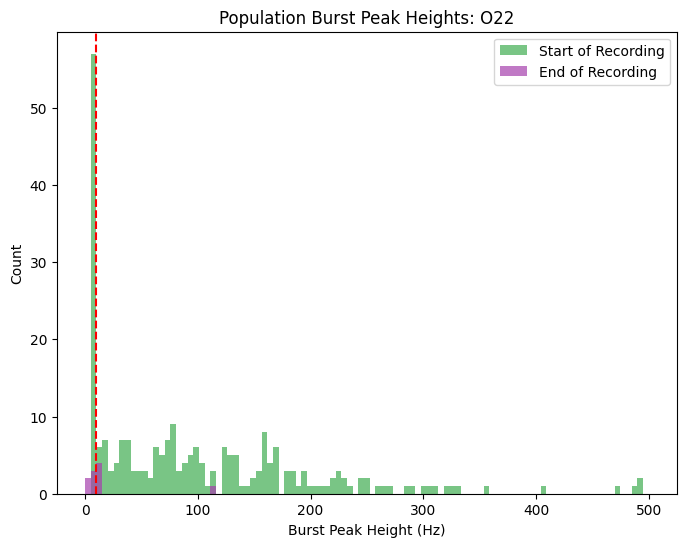

In [21]:
# Plot peak burst heights as histograms (different color for each group)
fig, ax = plt.subplots(figsize=(8, 6))

max_value = 500
num_bins = 100

bins = np.linspace(0, max_value, num_bins)

for name, peak_heights in burst_peak_height_data.items():
    ax.hist(peak_heights, bins=bins, color=group_colors[name], alpha=0.7, label=name)
ax.set_title(f"Population Burst Peak Heights: {organoid_id}")
ax.set_xlabel("Burst Peak Height (Hz)")
ax.set_ylabel("Count")
ax.legend()


# OPTIONAL - plot peak height threshold
threshold = 10
ax.axvline(threshold, color="red", linestyle="--", label="Burst Detection Threshold")

plt.show()

Analyze population burst metrics (num_bursts, burst_peak_heights, interburst_intervals, burst_durations, percentage of active electrodes, weighted sttc)

In [22]:
# Get burst metrics

burst_metrics_data = {}

for name, sessions in session_dict.items():

    if len(sessions) == 0:
        continue

    burst_indices, burst_peak_heights, burst_bounds, burst_spike_array, weighted_sttc = (mua.PopulationBursts & sessions).fetch("burst_indices", "burst_peak_heights", "burst_bounds", "burst_spike_array", "weighted_sttc")
    
    # concatenate data across sessions
    burst_peak_heights = np.concatenate(burst_peak_heights)
    burst_bounds = np.concatenate(burst_bounds)
    burst_spike_array = np.concatenate(burst_spike_array)
    weighted_sttc = np.concatenate(weighted_sttc)

    # threshold based on peak height
    peak_height_threshold = 10

    valid_burst_mask = burst_peak_heights >= peak_height_threshold

    # get number of bursts
    num_bursts = np.sum(valid_burst_mask)

    # get peak burst heights
    peak_heights = burst_peak_heights[valid_burst_mask]

    # get inter-burst intervals (s)
    max_burst_interval = 60 # seconds

    inter_burst_intervals = np.hstack([np.diff(session_burst_indices) / 1000 for session_burst_indices in burst_indices])
    inter_burst_intervals = inter_burst_intervals[inter_burst_intervals <= max_burst_interval]

    # get burst durations (ms)
    burst_durations = np.diff(burst_bounds, axis=1).flatten()[valid_burst_mask]

    # percentage of active electrodes
    percent_active_elec = np.sum(np.sum(burst_spike_array, axis=2) > 0, axis=1) / num_elec_inside * 100

    # weighted STTC
    mean_weighted_sttc = weighted_sttc[valid_burst_mask]

    # store in dictionary
    burst_metrics_data[name] = {
        "num_bursts": num_bursts,
        "peak_heights": peak_heights,
        "inter_burst_intervals": inter_burst_intervals,
        "burst_durations": burst_durations,
        "percent_active_elec": percent_active_elec,
        "mean_weighted_sttc": mean_weighted_sttc
    }

C:\Users\Organoid PC\AppData\Local\Temp\ipykernel_21700\2189702622.py:56: RuntimeWarning:

Mean of empty slice



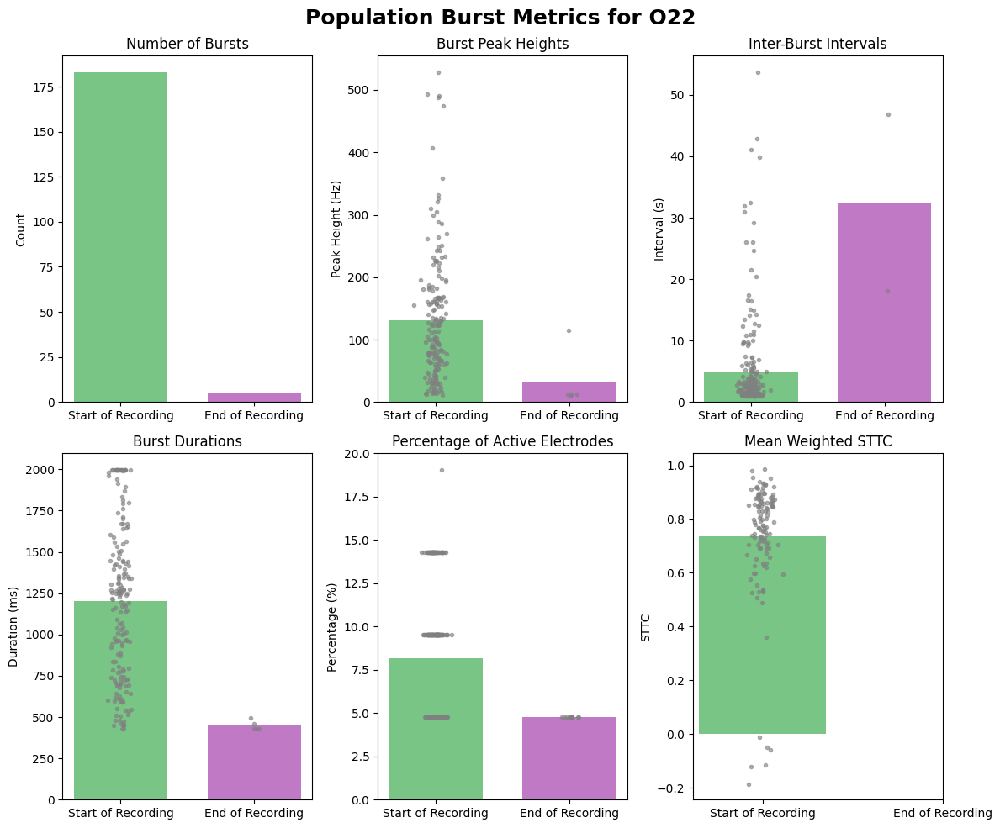

In [23]:
# Plot population burst metrics

fig, axs = plt.subplots(2, 3, figsize=(12, 10), tight_layout=True)
fig.suptitle(f"Population Burst Metrics for {organoid_id}", fontsize=18, fontweight="bold")

barwidth = .7

for group_idx, (name, metrics) in enumerate(burst_metrics_data.items()):

    # number of bursts
    ax = axs[0, 0]
    ax.bar(group_idx, metrics["num_bursts"], color=group_colors[name], width=barwidth, alpha=0.7)
    ax.set_title("Number of Bursts")
    ax.set_xticks(range(len(burst_metrics_data)))
    ax.set_xticklabels(burst_metrics_data.keys())
    ax.set_ylabel("Count")

    # burst peak heights
    ax = axs[0, 1]
    ax.bar(group_idx, np.mean(metrics["peak_heights"]), color=group_colors[name], width=barwidth, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=len(metrics["peak_heights"])), metrics["peak_heights"], color="grey", alpha=0.6, marker=".")
    ax.set_title("Burst Peak Heights")
    ax.set_xticks(range(len(burst_metrics_data)))
    ax.set_xticklabels(burst_metrics_data.keys())
    ax.set_ylabel("Peak Height (Hz)")

    # inter-burst intervals
    ax = axs[0, 2]
    ax.bar(group_idx, np.mean(metrics["inter_burst_intervals"]), color=group_colors[name], width=barwidth, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=len(metrics["inter_burst_intervals"])), metrics["inter_burst_intervals"], color="grey", alpha=0.6, marker=".")
    ax.set_title("Inter-Burst Intervals")
    ax.set_xticks(range(len(burst_metrics_data)))
    ax.set_xticklabels(burst_metrics_data.keys())
    ax.set_ylabel("Interval (s)")

    # burst durations
    ax = axs[1, 0]
    ax.bar(group_idx, np.mean(metrics["burst_durations"]), color=group_colors[name], width=barwidth, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=len(metrics["burst_durations"])), metrics["burst_durations"], color="grey", alpha=0.6, marker=".")
    ax.set_title("Burst Durations")
    ax.set_xticks(range(len(burst_metrics_data)))
    ax.set_xticklabels(burst_metrics_data.keys())
    ax.set_ylabel("Duration (ms)")

    # percentage of active electrodes
    ax = axs[1, 1]
    ax.bar(group_idx, np.mean(metrics["percent_active_elec"]), color=group_colors[name], width=barwidth, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=len(metrics["percent_active_elec"])), metrics["percent_active_elec"], color="grey", alpha=0.6, marker=".")
    ax.set_title("Percentage of Active Electrodes")
    ax.set_xticks(range(len(burst_metrics_data)))
    ax.set_xticklabels(burst_metrics_data.keys())
    ax.set_ylabel("Percentage (%)")

    # weighted STTC
    ax = axs[1, 2]
    ax.bar(group_idx, np.nanmean(metrics["mean_weighted_sttc"]), color=group_colors[name], width=barwidth, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=len(metrics["mean_weighted_sttc"])), metrics["mean_weighted_sttc"], color="grey", alpha=0.6, marker=".")
    ax.set_title("Mean Weighted STTC")
    ax.set_xticks(range(len(burst_metrics_data)))
    ax.set_xticklabels(burst_metrics_data.keys())
    ax.set_ylabel("STTC")

plt.show()

In [24]:
# Get population burst waveforms per session
burst_waveform_data = {}
peak_height_threshold = 10

for name, sessions in session_dict.items():
    burst_waveform_data[name] = {}

    for session in sessions:

        burst_heights, spike_burst_arrays = (mua.PopulationBursts & session).fetch1("burst_peak_heights", "burst_spike_array")

        # filter spike arrays based on peak height threshold
        spike_burst_arrays = spike_burst_arrays[burst_heights >= peak_height_threshold]

        if len(spike_burst_arrays) == 0:
            continue

        # compute burst waveforms by summing firing rates across bursts across electrodes
        burst_waveforms = np.sum(spike_burst_arrays, axis=1)

        # convert to firing rate (from boolean)
        burst_firing_rates = burst_waveforms * 1000

        # filter firing rate
        burst_firing_rates = bn.move_mean(burst_firing_rates, 5, min_count=1, axis=1)
        burst_firing_rates = gaussian_filter(burst_firing_rates, sigma=5.0, axes=1)

        # put into dictionary
        burst_waveform_data[name][f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"] = burst_firing_rates


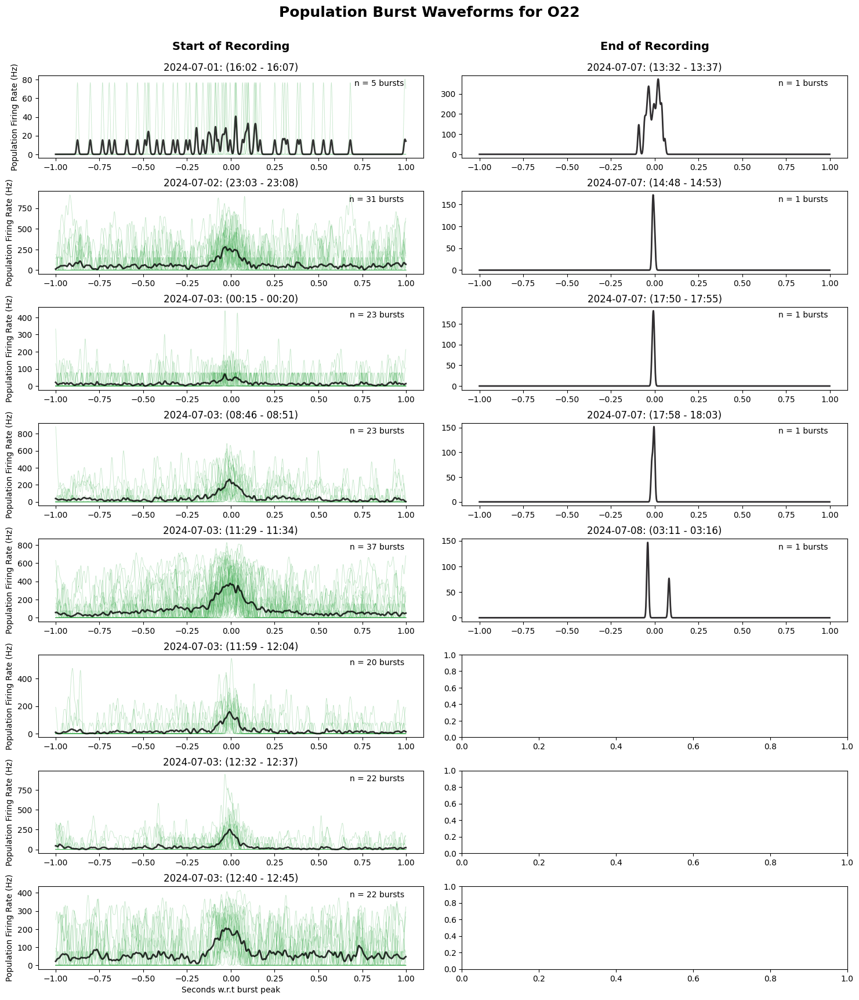

In [25]:
# Plot population burst traces with burst peaks highlighted and session titles
# (num_sessions x num_groups) figure, time on the x-axis, population firing rate on the y-axis, individual bursts in light red, average burst waveform in black

num_groups = len(burst_waveform_data)
num_sessions = max(len(group_dict) for group_dict in burst_waveform_data.values())

fig, axs = plt.subplots(
    num_sessions,
    num_groups,
    figsize=(9 * num_groups, 2.5 * num_sessions),
    squeeze=False,
)
fig.subplots_adjust(wspace=0.1, hspace=0.4)
fig.suptitle(
    f"Population Burst Waveforms for {organoid_id}",
    fontsize=18,
    fontweight="bold",
    y=.94
)

for group_idx, (group_name, group_dict) in enumerate(burst_waveform_data.items()):

    for session_idx, (session_name, burst_firing_rates) in enumerate(group_dict.items()):
        ax = axs[session_idx, group_idx]

        time_axis = np.arange(-1, 1, .001)
        for individual_burst in burst_firing_rates:
            ax.plot(time_axis, individual_burst, color=group_colors[group_name], alpha=0.3, linewidth=.6)
        ax.plot(time_axis, np.mean(burst_firing_rates, axis=0), color="black", alpha=0.8, linewidth=2)

        ax.set_title(session_name)

        if group_idx == 0:
            ax.set_ylabel("Population Firing Rate (Hz)")

        if session_idx == num_sessions - 1 and group_idx < len(group_dict):
            ax.set_xlabel("Seconds w.r.t burst peak")

        # put text in top right corner
        ax.text(0.95, 0.95, f"n = {burst_firing_rates.shape[0]} bursts", transform=ax.transAxes, ha="right", va="top", fontsize=10)

# Add one title centered above each column (one column per group)
for group_idx, group_name in enumerate(burst_waveform_data.keys()):
    col_axes = axs[:, group_idx]

    # column span in figure coordinates
    x0 = min(ax.get_position().x0 for ax in col_axes)
    x1 = max(ax.get_position().x1 for ax in col_axes)
    y1 = max(ax.get_position().y1 for ax in col_axes)

    # centered column title slightly above that column
    fig.text(
        (x0 + x1) / 2,
        y1 + 0.02,
        group_name,
        ha="center",
        va="bottom",
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [26]:
# Get cummulative population burst spikes

cummulative_burst_waveform_data = {}

for name, group_dict in burst_waveform_data.items():

    if len(group_dict) == 0:
        continue

    group_bursts = np.vstack(list(group_dict.values()))

    # convert from firing rate to cumulative spikes
    cummulative_burst_spikes = np.cumsum(group_bursts, axis=1) / 1000 

    cummulative_burst_waveform_data[name] = cummulative_burst_spikes

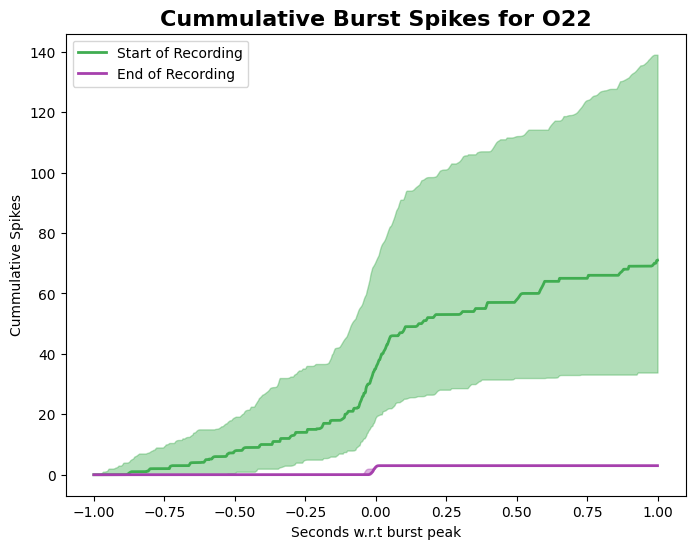

In [27]:
# Plot cummulative spikes during bursts
# 1x1 figure (each group is a different color), the median cummulative burst spikes is in a bolded line, the IQR is in a shaded region

fig, ax = plt.subplots(figsize=(8, 6))
for name, cummulative_burst_spikes in cummulative_burst_waveform_data.items():

    median_cummulative_spikes = np.median(cummulative_burst_spikes, axis=0)
    lower_quartile = np.percentile(cummulative_burst_spikes, 25, axis=0)
    upper_quartile = np.percentile(cummulative_burst_spikes, 75, axis=0)

    time_axis = np.arange(-1, 1, .001)

    ax.plot(time_axis, median_cummulative_spikes, color=group_colors[name], label=name, linewidth=2, alpha=1)
    ax.fill_between(time_axis, lower_quartile, upper_quartile, color=group_colors[name], alpha=0.4)

ax.set_title(f"Cummulative Burst Spikes for {organoid_id}", fontsize=16, fontweight="bold")
ax.set_xlabel("Seconds w.r.t burst peak")
ax.set_ylabel("Cummulative Spikes")
ax.legend(loc="upper left")

plt.show()

Inter-spike intervals

In [28]:
# Get inter-spike interval data

isi_data = {}
max_isi = 100 # ms

for name, sessions in session_dict.items():
    isi_data[name] = {}

    for session in sessions:

        spike_indices, start_times, channel_ids = (mua.MUASpikes.Channel & 
                                        f"start_time BETWEEN '{session['start_time']}' AND '{session['end_time']}'" & 
                                        f"organoid_id = '{session['organoid_id']}'").fetch("spike_indices", "start_time", "channel_idx")

        # convert spike indices to spike times in seconds (relative to session start time)
        spike_times = (spike_indices / fs) + (start_times - session["start_time"]).astype("timedelta64[s]").astype(int)

        # map channels to electrodes
        electrodes = map_channel_to_electrode(input_indices = channel_ids)
        
        session_isi_data = []
        for electrode in range(num_elec_inside):
            
            # compute ISIs in seconds
            electrode_spikes = np.sort(np.concatenate(spike_times[electrodes == electrode]))
            isis = np.diff(electrode_spikes)

            session_isi_data.append(isis)
        
        session_isi_data = np.concatenate(session_isi_data)
        session_isi_data = session_isi_data[session_isi_data <= max_isi]

        isi_data[name][f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"] = session_isi_data

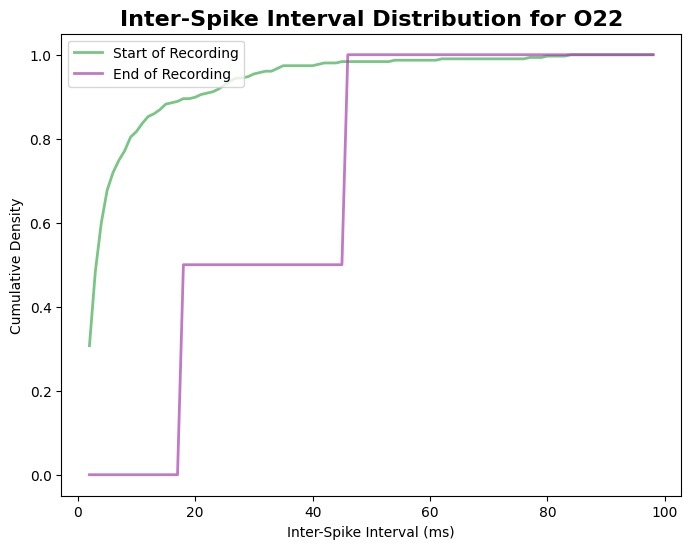

In [29]:
# Plot isis on a cummulative density plot (different color for each group)
fig, ax = plt.subplots(figsize=(8, 6))
bins = np.arange(2, 100, 1)

for name, session_data_dict in isi_data.items():

    if len(session_data_dict) == 0:
        continue

    all_isis = np.concatenate(list(session_data_dict.values()))

    isi_distribution = np.histogram(all_isis, bins=bins, density=True)[0]
    cdf = np.cumsum(isi_distribution) * np.diff(bins)

    ax.plot(bins[:-1], cdf, color=group_colors[name], label=name, linewidth=2, alpha=0.7)

ax.set_title(f"Inter-Spike Interval Distribution for {organoid_id}", fontsize=16, fontweight="bold")
ax.set_xlabel("Inter-Spike Interval (ms)")
ax.set_ylabel("Cumulative Density")
ax.legend(loc="upper left")

plt.show()

## Spectral Analysis

In [30]:
# Get spectrogram data

spectrogram_data = {}
min_freq = 1 # Hz
max_freq = 300 # Hz

time, frequency = (analysis.LFPSpectrogram.ChannelSpectrogram & session_dict[analysis_names[0]][0] & "electrode = 0").fetch1("time", "frequency")

for name, sessions in session_dict.items():
    spectrogram_data[name] = {}

    if len(sessions) == 0:
        continue

    spectrograms, start_times = (analysis.LFPSpectrogram.ChannelSpectrogram & sessions).fetch("spectrogram", "start_time", order_by="electrode")
    spectrograms = np.stack([spec[:, :297] for spec in spectrograms])

    for session in sessions:

        # get session spectrograms
        session_spectrograms = spectrograms[start_times == session['start_time'], :, :]

        # filter out non-lfp frequencies
        session_spectrograms = session_spectrograms[:, (frequency >= min_freq) & (frequency <= max_freq), :]

        # store in dictionary
        spectrogram_data[name][f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"] = session_spectrograms

lfp_frequencies = frequency[(frequency >= min_freq) & (frequency <= max_freq)]

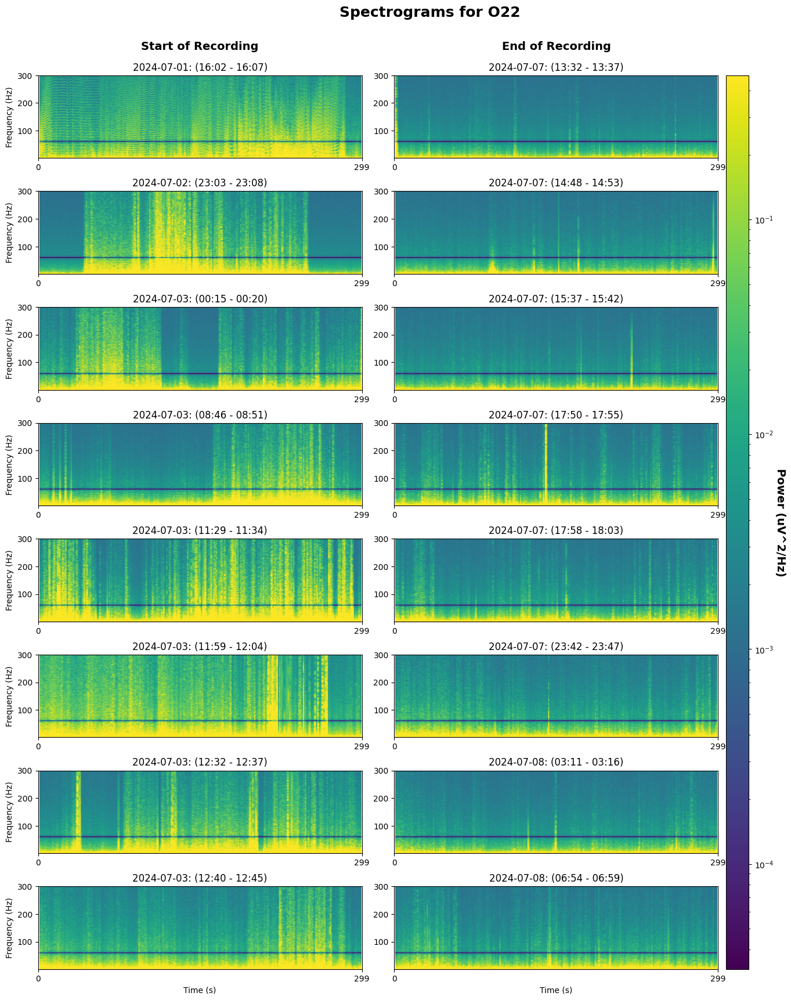

In [31]:
# Plot spectrograms for each session
# (num_sessions x num_groups) figure, time on the x-axis, frequency on the y-axis, power represented in color (global log color scale)

num_sessions = max(len(group_dict) for group_dict in spectrogram_data.values())

fig, axs = plt.subplots(
    num_sessions,
    num_groups,
    figsize=(9 * num_groups, 2.5 * num_sessions),
    squeeze=False,
)
fig.subplots_adjust(wspace=0.1, hspace=0.4)
fig.suptitle(
    f"Spectrograms for {organoid_id}",
    fontsize=18,
    fontweight="bold",
    y=.94
)

# determine vmax
all_spectrograms = np.concatenate([
    np.concatenate(list(group_dict.values()), axis=0)
    for group_dict in spectrogram_data.values()
    if len(group_dict) > 0
])
vmin = np.percentile(all_spectrograms, 2)
vmax = np.percentile(all_spectrograms, 98)

for group_idx, (group_name, group_dict) in enumerate(spectrogram_data.items()):

    for session_idx, (session_name, session_spectrograms) in enumerate(group_dict.items()):
        ax = axs[session_idx, group_idx]

        # compute mean spectrogram across electrodes
        mean_spectrogram = np.mean(session_spectrograms, axis=0)

        im = ax.imshow(mean_spectrogram, aspect="auto", cmap="viridis", origin="lower", extent=[time[0], time[-1], lfp_frequencies[0], lfp_frequencies[-1]], norm=LogNorm(vmin=vmin, vmax=vmax))

        session_duration = (session_dict[group_name][session_idx]['end_time'] - session_dict[group_name][session_idx]['start_time']).total_seconds()
        num_xticks = 2
        xticks = np.linspace(0, session_duration, num_xticks)
        ax.set_xticks(xticks)
        ax.set_xticklabels([f"{(x):.0f}" for x in xticks])
        ax.set_title(session_name)

        if group_idx == 0:
            ax.set_ylabel("Frequency (Hz)")

        if session_idx == num_sessions - 1 and group_idx < len(group_dict):
            ax.set_xlabel("Time (s)")

# add global colorbar (spanning all subplots)
cbar = fig.colorbar(im, ax=axs, orientation="vertical", pad=.01, aspect=40)
cbar.set_label("Power (uV^2/Hz)", rotation=270, labelpad=15, fontsize=14, fontweight="bold")

# Add one title centered above each column (one column per group)
for group_idx, group_name in enumerate(spectrogram_data.keys()):
    col_axes = axs[:, group_idx]

    # column span in figure coordinates
    x0 = min(ax.get_position().x0 for ax in col_axes)
    x1 = max(ax.get_position().x1 for ax in col_axes)
    y1 = max(ax.get_position().y1 for ax in col_axes)

    # centered column title slightly above that column
    fig.text(
        (x0 + x1) / 2,
        y1 + 0.02,
        group_name,
        ha="center",
        va="bottom",
        fontsize=14,
        fontweight="bold",
    )

plt.show()

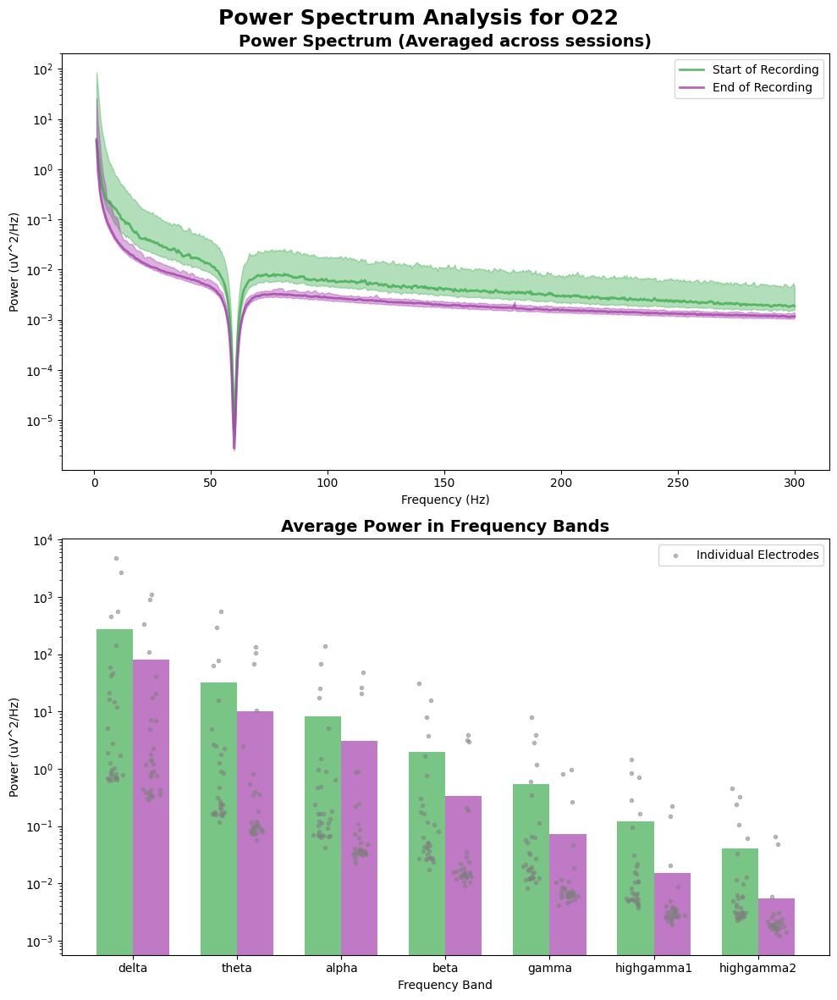

In [32]:
# Plot power spectrum for each group (averaged across sessions)
# 2x1 figure, 
# (top subplot) frequency on the x-axis, power on the y-axis, different color for each group, log scale for y-axis, line=median and shaded region=IQR (across electrodes)
# (bottom subplot) bar plot of average power in each frequency band for each group (different color for each group) (bars are mean, points are individual electrodes)

fig, axs = plt.subplots(2, 1, figsize=(10, 12), tight_layout=True)
fig.suptitle(f"Power Spectrum Analysis for {organoid_id}", fontsize=18, fontweight="bold")

# top subplot - power spectrum
ax = axs[0]
for name, group_dict in spectrogram_data.items():

    if len(group_dict) == 0:
        continue

    # concatenate session spectrograms across time
    group_spectrograms = np.concatenate(list(group_dict.values()), axis=2)

    # find mean power (per electrode)
    mean_power = np.mean(group_spectrograms, axis=2)

    median_power = np.median(mean_power, axis=0)
    lower_quartile = np.percentile(mean_power, 25, axis=0)
    upper_quartile = np.percentile(mean_power, 75, axis=0)

    ax.plot(lfp_frequencies, median_power, color=group_colors[name], label=name, linewidth=2, alpha=0.8)
    ax.fill_between(lfp_frequencies, lower_quartile, upper_quartile, color=group_colors[name], alpha=0.4)

ax.set_title("Power Spectrum (Averaged across sessions)", fontsize=14, fontweight="bold")
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Power (uV^2/Hz)")
ax.set_yscale("log")
ax.legend(loc="upper right")

# bottom subplot - average power in each frequency band
ax = axs[1]
bar_width = 0.35

for group_idx, (name, group_dict) in enumerate(spectrogram_data.items()):

    if len(group_dict) == 0:
        continue

    # concatenate session spectrograms across time
    group_spectrograms = np.concatenate(list(group_dict.values()), axis=2)

    # find mean power (per electrode)
    mean_power = np.mean(group_spectrograms, axis=2)

    band_powers = []
    for band_name, (lower_freq, upper_freq) in frequency_bands.items():

        freq_mask = (lower_freq <= lfp_frequencies) & (lfp_frequencies <= upper_freq)
        band_power = np.mean(mean_power[:, freq_mask], axis=1)
        band_powers.append(band_power)

    band_powers = np.array(band_powers)
    x = np.arange(len(frequency_bands)) + (group_idx * bar_width)

    ax.bar(x, np.mean(band_powers, axis=1), width=bar_width, color=group_colors[name], alpha=0.7)

    for i in range(band_powers.shape[0]):
        ax.scatter(np.random.normal(x[i], 0.04, size=band_powers.shape[1]), band_powers[i], color="grey", alpha=0.5, marker=".")

ax.scatter([], [], color="grey", alpha=0.5, marker=".", label="Individual Electrodes")

ax.set_title("Average Power in Frequency Bands", fontsize=14, fontweight="bold")
ax.set_xlabel("Frequency Band")
ax.set_xticks(np.arange(len(frequency_bands)) + bar_width / 2)
ax.set_xticklabels(frequency_bands.keys())
ax.set_ylabel("Power (uV^2/Hz)")
ax.set_yscale("log")
ax.legend(loc="upper right")

plt.show()


STTFA

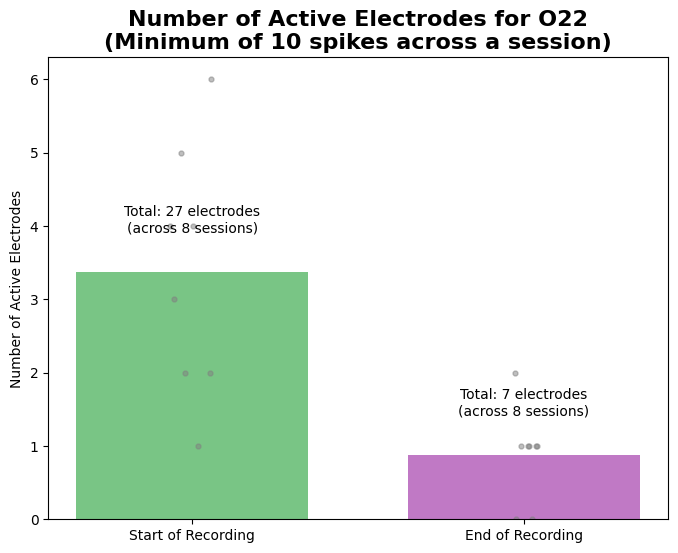

In [33]:
# Get number of active electrodes for the sessions (min spikes = 10)
active_electrode_data = {}
min_spikes = 10

for name, sessions in session_dict.items():

    group_data = []
    for session in sessions:

        num_active_electrodes = len(analysis.STTFA & session & f"spike_count >= {min_spikes}")
        group_data.append(num_active_electrodes)
    active_electrode_data[name] = group_data
    
# Plot number of active electrodes
# bar plot with different color for each group, points for each session
fig, ax = plt.subplots(figsize=(8, 6))
bar_width = 0.7
for group_idx, (name, group_data) in enumerate(active_electrode_data.items()):
    ax.bar(group_idx, np.mean(group_data), color=group_colors[name], width=bar_width, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=len(group_data)), group_data, s=50, color="grey", alpha=0.5, marker=".")

ax.set_title(f"Number of Active Electrodes for {organoid_id}\n(Minimum of 10 spikes across a session)", fontsize=16, fontweight="bold")
ax.set_xticks(range(len(active_electrode_data)))
ax.set_xticklabels(active_electrode_data.keys())
ax.set_ylabel("Number of Active Electrodes")

# add text indicating the total number of active electrodes per group
total_active_electrodes = {name: np.sum(group_data) for name, group_data in active_electrode_data.items()}
for group_idx, (name, total_active) in enumerate(total_active_electrodes.items()):
    ax.text(group_idx, np.mean(active_electrode_data[name]) + 0.5, f"Total: {total_active} electrodes\n(across {len(active_electrode_data[name])} sessions)", ha="center", va="bottom", fontsize=10)

plt.show()

In [34]:
# Get n_STTFA data (per electrode)

n_sttfa_data = {}
fmin = 1
fmax = 300

frequency = (analysis.STTFA & np.concatenate([list(sessions) for sessions in session_dict.values() if len(sessions) > 0]) & f"spike_count >= {min_spikes}").fetch("frequency")[0]
lfp_frequencies = frequency[(frequency >= fmin) & (frequency <= fmax)]

for name, sessions in session_dict.items():

    n_sttfa_data[name] = {}
    for session in sessions:

        electrodes, n_sttfa_values = (analysis.STTFA & session & f"spike_count >= {min_spikes}").fetch("electrode", "n_sttfa")

        if len(n_sttfa_values) == 0:
            print(f"skipping session {session['start_time']} - {session['end_time']} for {name} due to no STTFA data")
            continue

        if np.any(np.isnan(np.vstack(n_sttfa_values))):
            print(f"skipping session {session['start_time']} - {session['end_time']} for {name} due to NaN values in n_STTFA")
            continue
        
        session_n_sttfa_array = np.full((num_elec_inside, len(lfp_frequencies)), np.nan)

        # put n_sttfa values into array based on electrode index
        for electrode, electrode_n_sttfa in zip(electrodes, n_sttfa_values):

            # skip electrodes outside of organoid
            if electrode >= num_elec_inside:
                continue
            session_n_sttfa_array[electrode, :] = 10 ** electrode_n_sttfa[(frequency >= fmin) & (frequency <= fmax)]

        n_sttfa_data[name][f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"] = session_n_sttfa_array



skipping session 2024-07-07 14:48:06 - 2024-07-07 14:53:05 for End of Recording due to no STTFA data
skipping session 2024-07-07 15:37:06 - 2024-07-07 15:42:05 for End of Recording due to no STTFA data


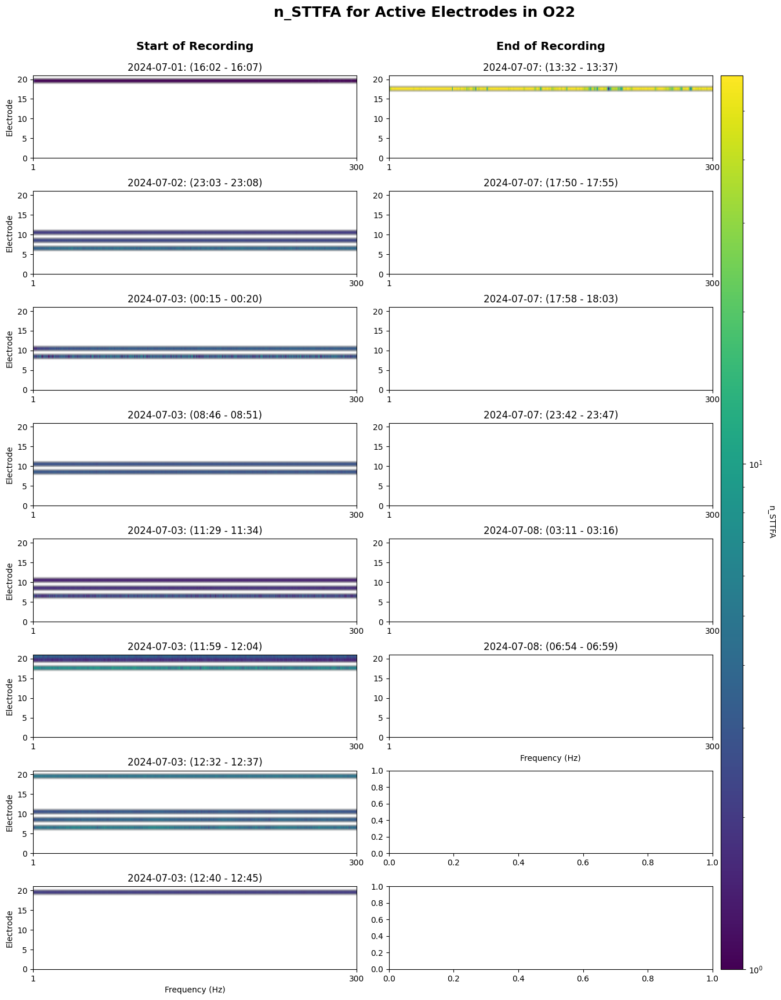

In [35]:
# Plot n_sttfa for each active electrode (group average in bold)
# (num_sessions x num_groups) figure, each group is represented as an image plot with frequency on the x-axis and electrode on the y-axis, color representing n_STTFA, log color scale
# electrodes with no STTFA data are shown in white

fig, axs = plt.subplots(num_sessions, num_groups, figsize=(9 * num_groups, 2.5 * num_sessions), squeeze=False)
fig.subplots_adjust(wspace=0.1, hspace=0.4)
fig.suptitle(f"n_STTFA for Active Electrodes in {organoid_id}", fontsize=18, fontweight="bold", y=.94)

# find vmin and vmax
all_n_sttfa_values = np.concatenate([
    np.concatenate(list(group_dict.values()), axis=0) for group_dict in n_sttfa_data.values() if len(group_dict) > 0
])
vmin = 1
vmax = np.nanpercentile(all_n_sttfa_values, 98)

for group_idx, (group_name, group_dict) in enumerate(n_sttfa_data.items()):
    for session_idx, (session_name, n_sttfa_array) in enumerate(group_dict.items()):
        ax = axs[session_idx, group_idx]

        im = ax.imshow(n_sttfa_array, aspect="auto", cmap="viridis", origin="lower", extent=[lfp_frequencies[0], lfp_frequencies[-1], 0, n_sttfa_array.shape[0]], norm=LogNorm(vmin=vmin, vmax=vmax))

        session_duration = (session_dict[group_name][session_idx]['end_time'] - session_dict[group_name][session_idx]['start_time']).total_seconds()
        num_xticks = 2
        xticks = np.linspace(lfp_frequencies[0], lfp_frequencies[-1], num_xticks)
        ax.set_xticks(xticks)
        ax.set_xticklabels([f"{(x):.0f}" for x in xticks])
        ax.set_title(session_name)

        if group_idx == 0:
            ax.set_ylabel("Electrode")

    ax.set_xlabel("Frequency (Hz)")

# add global colorbar (spanning all subplots)
cbar = fig.colorbar(im, ax=axs, orientation="vertical", pad=.01, aspect=40)
cbar.set_label("n_STTFA", rotation=270, labelpad=15)

# Add one title centered above each column (one column per group)
for group_idx, group_name in enumerate(n_sttfa_data.keys()):
    col_axes = axs[:, group_idx]

    # column span in figure coordinates
    x0 = min(ax.get_position().x0 for ax in col_axes)
    x1 = max(ax.get_position().x1 for ax in col_axes)
    y1 = max(ax.get_position().y1 for ax in col_axes)

    # centered column title slightly above that column
    fig.text(
        (x0 + x1) / 2,
        y1 + 0.02,
        group_name,
        ha="center",
        va="bottom",
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [36]:
# Get electrode average sttfa data (a, r, n) across sessions
electrode_sttfa_data = {}

fmin = 1
fmax = 300
frequency = (analysis.STTFA & np.concatenate([list(sessions)for sessions in session_dict.values()]) & f"spike_count >= {min_spikes}").fetch("frequency")[0]

for name, sessions in session_dict.items():

    group_dict = {
        "a_sttfa": [],
        "r_sttfa": [],
        "n_sttfa": []
    }

    electrodes, a_sttfa, r_sttfa, n_sttfa = (analysis.STTFA & sessions & f"spike_count >= {min_spikes}").fetch("electrode", "a_sttfa", "r_sttfa", "n_sttfa")

    if len(electrodes) > 0:
        a_sttfa = np.stack(a_sttfa)[:, (frequency >= fmin) & (frequency <= fmax)]
        r_sttfa = np.stack(r_sttfa)[:, (frequency >= fmin) & (frequency <= fmax)]
        n_sttfa = 10 ** np.stack(n_sttfa)[:, (frequency >= fmin) & (frequency <= fmax)]

        for elec in np.unique(electrodes):

            if elec > num_elec_inside:
                continue

            elec_mask = electrodes == elec
            group_dict["a_sttfa"].append(np.mean(a_sttfa[elec_mask], axis=0))
            group_dict["r_sttfa"].append(np.mean(r_sttfa[elec_mask], axis=0))
            group_dict["n_sttfa"].append(np.mean(n_sttfa[elec_mask], axis=0))

        
    # convert to arrays
    for key, value in group_dict.items():
        group_dict[key] = np.array(value)
    
    electrode_sttfa_data[name] = group_dict

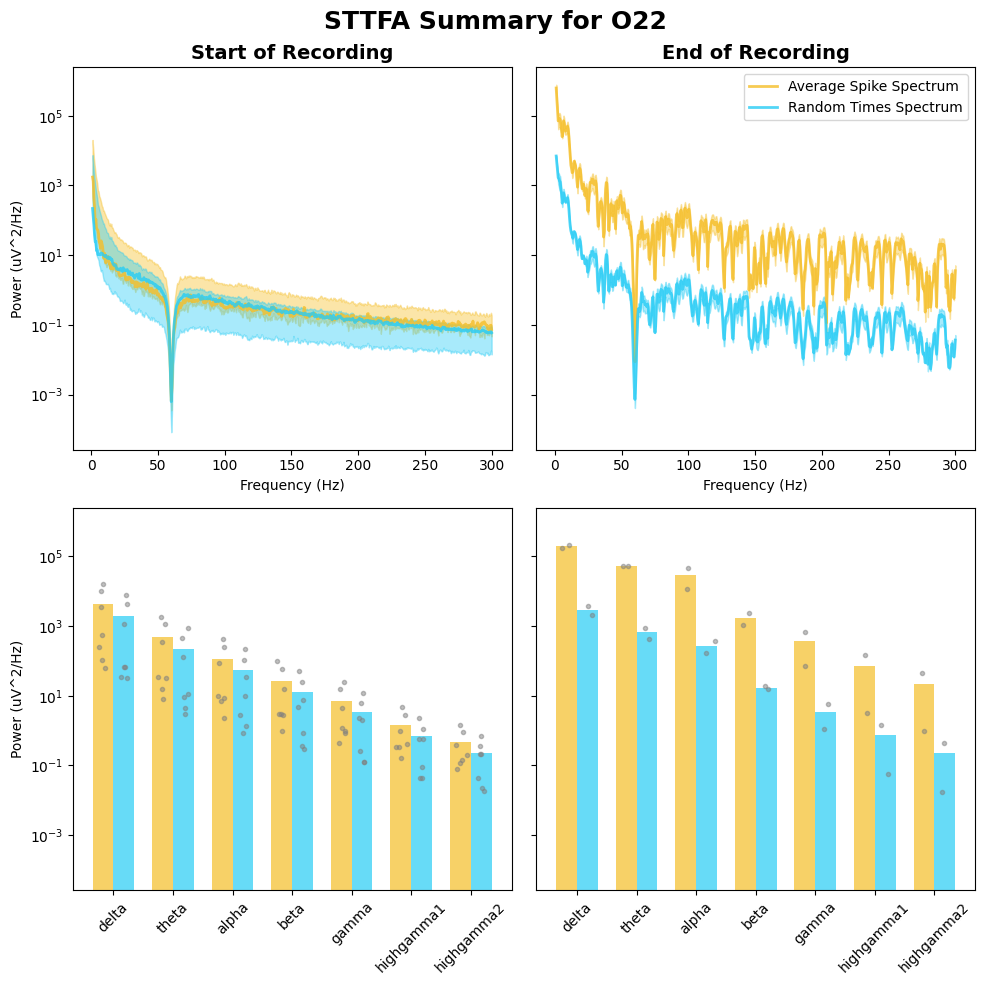

In [37]:
# Plot summary sttfa values across groups
# custom figure: top row = (1 x num groups) showing a_sttfa and r_sttfa as different colors for each group. 
# bottom row = bar plots of frequency band averages

sttfa_colors = {
    "a_sttfa": "#F5BE27",
    "r_sttfa": "#27CCF5",
} 

fig, axs = plt.subplots(2, num_groups, figsize=(5 * num_groups, 10), tight_layout=True, sharey=True)
fig.suptitle(f"STTFA Summary for {organoid_id}", fontsize=18, fontweight="bold")

lfp_frequencies = frequency[(frequency >= fmin) & (frequency <= fmax)]

# Plot top row (a_sttfa and r_sttfa comparison)
axs[0,0].set_ylabel("Power (uV^2/Hz)")

for group_idx, (name, group_dict) in enumerate(electrode_sttfa_data.items()):

    ax = axs[0, group_idx]

    if len(group_dict["a_sttfa"]) == 0:
        continue

    # plot a_sttfa
    a_sttfa_median = np.median(group_dict["a_sttfa"], axis=0)
    a_sttfa_q1 = np.percentile(group_dict["a_sttfa"], 25, axis=0)
    a_sttfa_q3 = np.percentile(group_dict["a_sttfa"], 75, axis=0)

    ax.plot(lfp_frequencies, a_sttfa_median, color=sttfa_colors["a_sttfa"], label="Average Spike Spectrum", linewidth=2, alpha=0.8)
    ax.fill_between(lfp_frequencies, a_sttfa_q1, a_sttfa_q3, color=sttfa_colors["a_sttfa"], alpha=0.4)

    # plot r_sttfa
    r_sttfa_median = np.median(group_dict["r_sttfa"], axis=0)
    r_sttfa_q1 = np.percentile(group_dict["r_sttfa"], 25, axis=0)
    r_sttfa_q3 = np.percentile(group_dict["r_sttfa"], 75, axis=0)

    ax.plot(lfp_frequencies, r_sttfa_median, color=sttfa_colors["r_sttfa"], label="Random Times Spectrum", linewidth=2, alpha=0.8)
    ax.fill_between(lfp_frequencies, r_sttfa_q1, r_sttfa_q3, color=sttfa_colors["r_sttfa"], alpha=0.4)

    ax.set_title(name, fontsize=14, fontweight="bold")
    ax.set_xlabel("Frequency (Hz)")
    ax.set_yscale("log")
ax.legend(loc="upper right")

# Plot bottom row (bar plots of frequency band averages)
bar_width = 0.35

for group_idx, (name, group_dict) in enumerate(electrode_sttfa_data.items()):

    ax = axs[1, group_idx]

    if len(group_dict["a_sttfa"]) == 0:
        continue

    # loop through frequency bands and plot bars for a_sttfa and r_sttfa
    for band_idx, (band_name, (lower_freq, upper_freq)) in enumerate(frequency_bands.items()):

        freq_mask = (lower_freq <= lfp_frequencies) & (lfp_frequencies <= upper_freq)

        a_band_power = np.mean(group_dict["a_sttfa"][:, freq_mask], axis=1)
        r_band_power = np.mean(group_dict["r_sttfa"][:, freq_mask], axis=1)

        x = np.array([band_idx - bar_width/2, band_idx + bar_width/2])
        ax.bar(x[0], np.mean(a_band_power), width=bar_width, color=sttfa_colors["a_sttfa"], alpha=0.7)
        ax.bar(x[1], np.mean(r_band_power), width=bar_width, color=sttfa_colors["r_sttfa"], alpha=0.7)

        # plot individual electrode values
        ax.scatter(np.random.normal(x[0], 0.04, size=a_band_power.shape[0]), a_band_power, color="grey", alpha=0.5, marker=".")
        ax.scatter(np.random.normal(x[1], 0.04, size=r_band_power.shape[0]), r_band_power, color="grey", alpha=0.5, marker=".")


    ax.set_xticks(np.arange(len(frequency_bands)))
    ax.set_xticklabels(frequency_bands.keys(), rotation=45, fontsize=10)
    ax.set_yscale("log")

    if group_idx == 0:
        ax.set_ylabel("Power (uV^2/Hz)")

plt.show()

In [38]:
z_scored_n_sttfa_data = {} # z-score across frequencies for each session

fmin = 1
frequency = (analysis.STTFA & np.concatenate([list(sessions)for sessions in session_dict.values()]) & f"spike_count >= {min_spikes}").fetch("frequency")[0]

for name, sessions in session_dict.items():

    electrodes, n_sttfa = (analysis.STTFA & sessions & f"spike_count >= {min_spikes}").fetch("electrode", "n_sttfa")

    if len(electrodes) == 0:
        continue

    # adjust data to be in linear scale and filter frequencies
    n_sttfa = 10 ** np.stack(n_sttfa)[:, (frequency >= fmin) & (frequency <= fmax)]
    n_sttfa_z_scores = stats.zscore(n_sttfa, axis=1)

    group_data = []
    for elec in np.unique(electrodes):

        if elec > num_elec_inside:
            continue

        elec_mask = electrodes == elec
        group_data.append(np.mean(n_sttfa_z_scores[elec_mask], axis=0))
    
    # convert to arrays
    z_scored_n_sttfa_data[name] = np.array(group_data)


Start of Recording - delta nSTTFA: 3.42
Start of Recording - theta nSTTFA: 3.26
Start of Recording - alpha nSTTFA: 3.08
Start of Recording - beta nSTTFA: 3.33
Start of Recording - gamma nSTTFA: 3.38
Start of Recording - highgamma1 nSTTFA: 3.51
Start of Recording - highgamma2 nSTTFA: 3.24
End of Recording - delta nSTTFA: 61.48
End of Recording - theta nSTTFA: 86.9
End of Recording - alpha nSTTFA: 96.81
End of Recording - beta nSTTFA: 92.04
End of Recording - gamma nSTTFA: 84.03
End of Recording - highgamma1 nSTTFA: 72.0
End of Recording - highgamma2 nSTTFA: 70.86
Start of Recording - delta nSTTFA (z-scored): 0.1
Start of Recording - theta nSTTFA (z-scored): -0.07
Start of Recording - alpha nSTTFA (z-scored): -0.43
Start of Recording - beta nSTTFA (z-scored): -0.1
Start of Recording - gamma nSTTFA (z-scored): 0.04
Start of Recording - highgamma1 nSTTFA (z-scored): 0.24
Start of Recording - highgamma2 nSTTFA (z-scored): -0.02
End of Recording - delta nSTTFA (z-scored): -0.54
End of Record

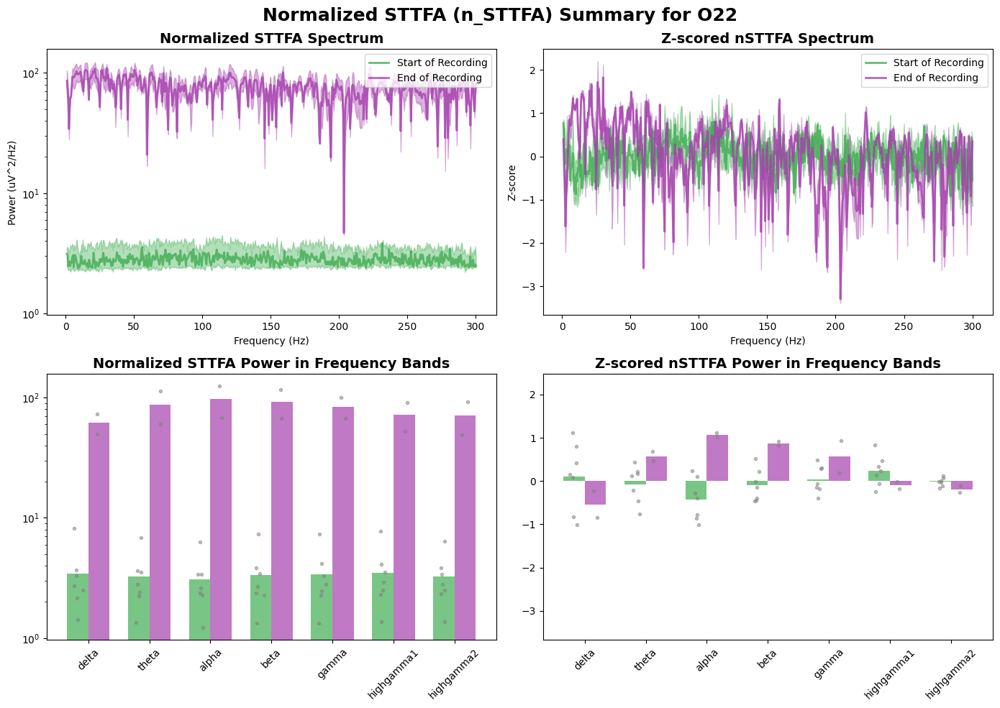

In [39]:
# Plot normalized STTFA spectrum (n_sttfa) for each group (median across electrodes with IQR shaded) and bar plots of frequency band averages

fig, axs = plt.subplots(2, 2, figsize=(7 * num_groups, 10), tight_layout=True, sharey='col')
fig.suptitle(f"Normalized STTFA (n_STTFA) Summary for {organoid_id}", fontsize=18, fontweight="bold")

# top subplots n_sttfa
ax = axs[0, 0]
for group_idx, (name, group_dict) in enumerate(electrode_sttfa_data.items()):

    if len(group_dict["n_sttfa"]) == 0:
        continue

    n_sttfa_median = np.median(group_dict["n_sttfa"], axis=0)
    n_sttfa_q1 = np.percentile(group_dict["n_sttfa"], 25, axis=0)
    n_sttfa_q3 = np.percentile(group_dict["n_sttfa"], 75, axis=0)

    ax.plot(lfp_frequencies, n_sttfa_median, color=group_colors[name], label=name, linewidth=2, alpha=0.8)
    ax.fill_between(lfp_frequencies, n_sttfa_q1, n_sttfa_q3, color=group_colors[name], alpha=0.4)

ax.set_title("Normalized STTFA Spectrum", fontsize=14, fontweight="bold")
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Power (uV^2/Hz)")
ax.set_yscale("log")
ax.legend(loc="upper right")

# plot power band values (bar plot)
bar_width = 0.35
ax = axs[1, 0]
for group_idx, (name, group_dict) in enumerate(electrode_sttfa_data.items()):
        
    if len(group_dict["n_sttfa"]) == 0:
        continue

    for band_idx, (band_name, (lower_freq, upper_freq)) in enumerate(frequency_bands.items()):

        freq_mask = (lower_freq <= lfp_frequencies) & (lfp_frequencies <= upper_freq)
        band_power = np.mean(group_dict["n_sttfa"][:, freq_mask], axis=1)

        x = band_idx + (group_idx * bar_width)
        ax.bar(x, np.mean(band_power), width=bar_width, color=group_colors[name], alpha=0.7)
        ax.scatter(np.random.normal(x, 0.04, size=band_power.shape[0]), band_power, color="grey", alpha=0.5, marker=".")

        # print power values
        print(f"{name} - {band_name} nSTTFA: {np.mean(band_power).round(2)}")

ax.set_xticks(np.arange(len(frequency_bands)) + bar_width / 2)
ax.set_xticklabels(frequency_bands.keys(), rotation=45, fontsize=10)
ax.set_title("Normalized STTFA Power in Frequency Bands", fontsize=14, fontweight="bold")

# bottom subplots z_scoreed_n_sttfa_data
ax = axs[0, 1]
for group_idx, (name, group_data) in enumerate(z_scored_n_sttfa_data.items()):

    if len(group_data) == 0:
        continue

    n_sttfa_median = np.median(group_data, axis=0)
    n_sttfa_q1 = np.percentile(group_data, 25, axis=0)
    n_sttfa_q3 = np.percentile(group_data, 75, axis=0)

    ax.plot(lfp_frequencies, n_sttfa_median, color=group_colors[name], label=name, linewidth=2, alpha=0.8)
    ax.fill_between(lfp_frequencies, n_sttfa_q1, n_sttfa_q3, color=group_colors[name], alpha=0.4)

ax.set_title("Z-scored nSTTFA Spectrum", fontsize=14, fontweight="bold")
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Z-score")
ax.legend(loc="upper right")

# plot power band values (bar plot)
bar_width = 0.35
ax = axs[1, 1]
for group_idx, (name, group_data) in enumerate(z_scored_n_sttfa_data.items()):
        
    if len(group_data) == 0:
        continue

    for band_idx, (band_name, (lower_freq, upper_freq)) in enumerate(frequency_bands.items()):

        freq_mask = (lower_freq <= lfp_frequencies) & (lfp_frequencies <= upper_freq)
        band_power = np.mean(group_data[:, freq_mask], axis=1)

        x = band_idx + (group_idx * bar_width)
        ax.bar(x, np.mean(band_power), width=bar_width, color=group_colors[name], alpha=0.7)
        ax.scatter(np.random.normal(x, 0.04, size=band_power.shape[0]), band_power, color="grey", alpha=0.5, marker=".")

        # print power values
        print(f"{name} - {band_name} nSTTFA (z-scored): {np.mean(band_power).round(2)}")

ax.set_xticks(np.arange(len(frequency_bands)) + bar_width / 2)
ax.set_xticklabels(frequency_bands.keys(), rotation=45, fontsize=10)
ax.set_title("Z-scored nSTTFA Power in Frequency Bands", fontsize=14, fontweight="bold")

plt.show()

FOOOF Analysis

Session fits

In [12]:
# Plot FOOOF fit for each session (averaged across electrodes)
fooof_param_idx = 3

for name, sessions in session_dict.items():

    for session in sessions:

        json_plot_object = (analysis.FOOOFAnalysis & session & f"fooof_param_idx = '{fooof_param_idx}'").fetch1("plot")

        fig = pio.from_json(json_plot_object)

        # add title to pio figure
        fig.update_layout(
            title={
                "text": f"FOOOF fit for {name}: {session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}",
                "x": 0.5,
                "xanchor": "center",
                "y": 0.95,
                "yanchor": "top",
                "pad": {"t": 5}
            },
            margin={"t": 60}
        )

        fig.show()

Summary aperiodic metrics (offset, exponent) across sessions

In [41]:
aperiodic_data = {}
for name, sessions in session_dict.items():

    aperiodic_data[name] = {
        "aperiodic_offset": [],
        "aperiodic_knee": [],
        "aperiodic_exponent": []
    }
    for session in sessions:
        summary_params = (analysis.FOOOFAnalysis & session & f"fooof_param_idx = '{fooof_param_idx}'").fetch1("summary_params")

        aperiodic_params = summary_params["aperiodic_params"]

        if len(aperiodic_params) == 3:
            offset, knee, exponent = aperiodic_params  
        elif len(aperiodic_params) == 2:
            offset, exponent = aperiodic_params
            knee = np.nan

        aperiodic_data[name]["aperiodic_offset"].append(10 ** offset)
        aperiodic_data[name]["aperiodic_knee"].append(knee)
        aperiodic_data[name]["aperiodic_exponent"].append(exponent)
    
    # convert to arrays
    aperiodic_data[name]["aperiodic_offset"] = np.array(aperiodic_data[name]["aperiodic_offset"])
    aperiodic_data[name]["aperiodic_knee"] = np.array(aperiodic_data[name]["aperiodic_knee"])
    aperiodic_data[name]["aperiodic_exponent"] = np.array(aperiodic_data[name]["aperiodic_exponent"])


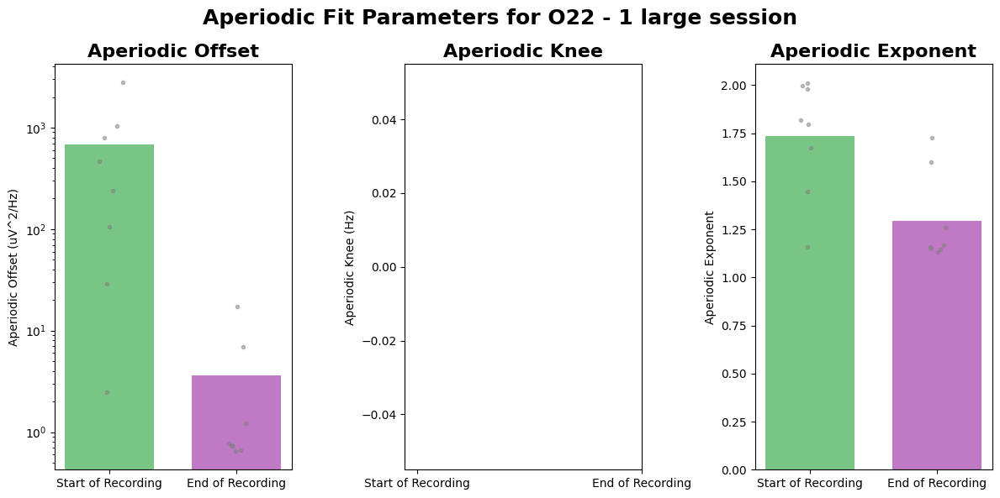

In [42]:
# Plot bar plots of aperiodic offset, knee, and exponent for each group (different color for each group, points for each session)
fig, axs = plt.subplots(1, 3, figsize=(12, 6), tight_layout=True)
fig.suptitle(f"Aperiodic Fit Parameters for {organoid_id} - 1 large session", fontsize=18, fontweight="bold")

# aperiodic offset
ax = axs[0]
bar_width = 0.7
for group_idx, (name, data) in enumerate(aperiodic_data.items()):
    ax.bar(group_idx, np.mean(data["aperiodic_offset"]), color=group_colors[name], width=bar_width, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=data["aperiodic_offset"].shape[0]), data["aperiodic_offset"], color="grey", alpha=0.5, marker=".")

ax.set_title(f"Aperiodic Offset", fontsize=16, fontweight="bold")
ax.set_xticks(range(len(aperiodic_data)))
ax.set_xticklabels(aperiodic_data.keys())
ax.set_ylabel("Aperiodic Offset (uV^2/Hz)")
ax.set_yscale("log")

# aperiodic knee
ax = axs[1]
for group_idx, (name, data) in enumerate(aperiodic_data.items()):
    ax.bar(group_idx, np.mean(data["aperiodic_knee"]), color=group_colors[name], width=bar_width, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=data["aperiodic_knee"].shape[0]), data["aperiodic_knee"], color="grey", alpha=0.5, marker=".")

ax.set_title(f"Aperiodic Knee", fontsize=16, fontweight="bold")
ax.set_xticks(range(len(aperiodic_data)))
ax.set_xticklabels(aperiodic_data.keys())
ax.set_ylabel("Aperiodic Knee (Hz)")

# aperiodic exponent
ax = axs[2]
for group_idx, (name, data) in enumerate(aperiodic_data.items()):
    ax.bar(group_idx, np.mean(data["aperiodic_exponent"]), color=group_colors[name], width=bar_width, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=data["aperiodic_exponent"].shape[0]), data["aperiodic_exponent"], color="grey", alpha=0.5, marker=".")
ax.set_title(f"Aperiodic Exponent", fontsize=16, fontweight="bold")
ax.set_xticks(range(len(aperiodic_data)))
ax.set_xticklabels(aperiodic_data.keys())
ax.set_ylabel("Aperiodic Exponent")


plt.show()

In [43]:
aperiodic_epoch_data = {}
for name, sessions in session_dict.items():

    aperiodic_data[name] = {
        "aperiodic_offset": [],
        "aperiodic_knee": [],
        "aperiodic_exponent": []
    }
    for session in sessions:
        
        aperiodic_offset, aperiodic_knee, aperiodic_exponent = (analysis.FOOOFAnalysis & session & f"fooof_param_idx = '{fooof_param_idx}'"
                                                                ).fetch1("aperiodic_offset", "aperiodic_knee", "aperiodic_exponent")
        
        aperiodic_data[name]["aperiodic_offset"].append(np.mean(10 ** aperiodic_offset))
        aperiodic_data[name]["aperiodic_knee"].append(np.mean(aperiodic_knee))
        aperiodic_data[name]["aperiodic_exponent"].append(np.mean(aperiodic_exponent))
    
    # convert to arrays
    aperiodic_data[name]["aperiodic_offset"] = np.array(aperiodic_data[name]["aperiodic_offset"])
    aperiodic_data[name]["aperiodic_knee"] = np.array(aperiodic_data[name]["aperiodic_knee"])
    aperiodic_data[name]["aperiodic_exponent"] = np.array(aperiodic_data[name]["aperiodic_exponent"])

Start of Recording - Aperiodic Offset: 719.9
Start of Recording - Aperiodic Exponent: 1.56
End of Recording - Aperiodic Offset: 257.41
End of Recording - Aperiodic Exponent: 1.04


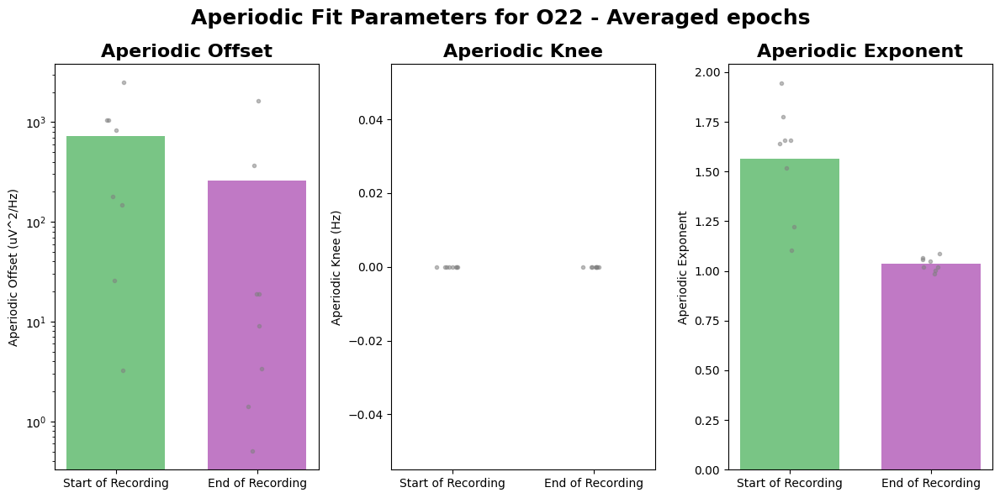

In [44]:
# Plot bar plots of aperiodic offset, knee, and exponent for each group (different color for each group, points for each session)
fig, axs = plt.subplots(1, 3, figsize=(12, 6), tight_layout=True)
fig.suptitle(f"Aperiodic Fit Parameters for {organoid_id} - Averaged epochs", fontsize=18, fontweight="bold")

# aperiodic offset
ax = axs[0]
bar_width = 0.7
for group_idx, (name, data) in enumerate(aperiodic_data.items()):
    ax.bar(group_idx, np.mean(data["aperiodic_offset"]), color=group_colors[name], width=bar_width, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=data["aperiodic_offset"].shape[0]), data["aperiodic_offset"], color="grey", alpha=0.5, marker=".")

ax.set_title(f"Aperiodic Offset", fontsize=16, fontweight="bold")
ax.set_xticks(range(len(aperiodic_data)))
ax.set_xticklabels(aperiodic_data.keys())
ax.set_ylabel("Aperiodic Offset (uV^2/Hz)")
ax.set_yscale("log")

# aperiodic knee
ax = axs[1]
for group_idx, (name, data) in enumerate(aperiodic_data.items()):
    ax.bar(group_idx, np.mean(data["aperiodic_knee"]), color=group_colors[name], width=bar_width, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=data["aperiodic_knee"].shape[0]), data["aperiodic_knee"], color="grey", alpha=0.5, marker=".")

ax.set_title(f"Aperiodic Knee", fontsize=16, fontweight="bold")
ax.set_xticks(range(len(aperiodic_data)))
ax.set_xticklabels(aperiodic_data.keys())
ax.set_ylabel("Aperiodic Knee (Hz)")

# aperiodic exponent
ax = axs[2]
for group_idx, (name, data) in enumerate(aperiodic_data.items()):
    ax.bar(group_idx, np.mean(data["aperiodic_exponent"]), color=group_colors[name], width=bar_width, alpha=0.7)
    ax.scatter(np.random.normal(group_idx, 0.04, size=data["aperiodic_exponent"].shape[0]), data["aperiodic_exponent"], color="grey", alpha=0.5, marker=".")
ax.set_title(f"Aperiodic Exponent", fontsize=16, fontweight="bold")
ax.set_xticks(range(len(aperiodic_data)))
ax.set_xticklabels(aperiodic_data.keys())
ax.set_ylabel("Aperiodic Exponent")

# print aperiodic parameter values
for name, data in aperiodic_data.items():
    print(f"{name} - Aperiodic Offset: {np.mean(data['aperiodic_offset']).round(2)}")
    print(f"{name} - Aperiodic Exponent: {np.mean(data['aperiodic_exponent']).round(2)}")

plt.show()

Summary oscillatory activity (power above aperiodic fit) across sessions

In [45]:
# Get oscillatory data
oscillatory_data = {}

frequency = (analysis.FOOOFAnalysis & session_dict[analysis_names[0]][0]).fetch("frequency")[0]

for name, sessions in session_dict.items():

    oscillatory_activity = (analysis.FOOOFAnalysis & sessions & f"fooof_param_idx = '{fooof_param_idx}'").fetch("oscillatory_activity")
    oscillatory_activity = np.stack(oscillatory_activity)

    oscillatory_data[name] = oscillatory_activity

Plot time-varying FOOOF metrics (and MUA firing rates) across the entire recording to visualize how these metrics change over time. (per session)

In [46]:
# get time varying fooof and mua data

time_varying_data = {}

dt = (analysis.FBOSCParamset * analysis.FOOOFAnalysis & session & f"fooof_param_idx = '{fooof_param_idx}'").fetch1("dt")
time = np.arange(0, (session['end_time'] - session['start_time']).total_seconds(), dt) + 5

for name, sessions in session_dict.items():
    time_varying_data[name] = {}

    for session in sessions:
        session_title = f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"

        # fetch mua trace data (sum across electrodes)
        mua_data = np.sum(firing_array_data[name][session_title][:num_elec_inside, :], axis=0) # make sure dt is the same as in fBOSC paramset

        # fetch time varying fooof data
        aperiodic_offset, aperiodic_exponent = (analysis.FOOOFAnalysis & session & f"fooof_param_idx = '{fooof_param_idx}'"
                                                ).fetch1("aperiodic_offset", "aperiodic_exponent")

        # create oscillatory burst array
        oscillatory_array = []
        time_bins = np.concatenate((time, [time[-1] + dt]))

        for band_name in frequency_bands.keys():

            oscillation_times, oscillation_heights = (analysis.FOOOFAnalysis.FBOSCAnalysis & session & f"band_name = '{band_name}'" & f"fooof_param_idx = '{fooof_param_idx}'"
                                                      ).fetch1("oscillation_times", "oscillation_heights")

            # account for no oscillation_data
            if len(oscillation_times) == 0:
                band_oscillations = np.zeros(len(time))
                oscillatory_array.append(band_oscillations)
                continue
            
            # insert oscillation heights into array based on oscillation times
            band_oscillations = np.histogram(oscillation_times, bins=time_bins)[0]
            for height_index, oscillation_index in enumerate(np.where(band_oscillations)[0]):
                band_oscillations[oscillation_index] = oscillation_heights[height_index]

            oscillatory_array.append(band_oscillations)
            
        time_varying_data[name][session_title] = {
            "mua": mua_data,
            "aperiodic_offset": 10 ** aperiodic_offset,
            "aperiodic_exponent": aperiodic_exponent,
            "oscillatory_array": np.array(oscillatory_array)

        }

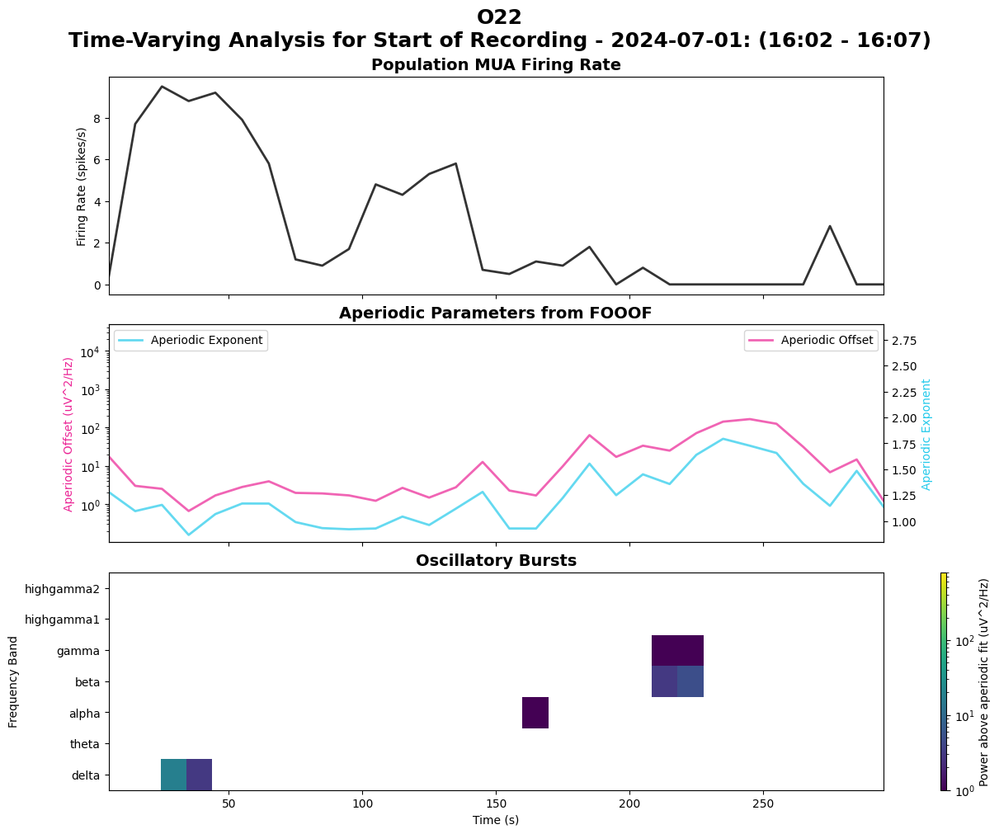

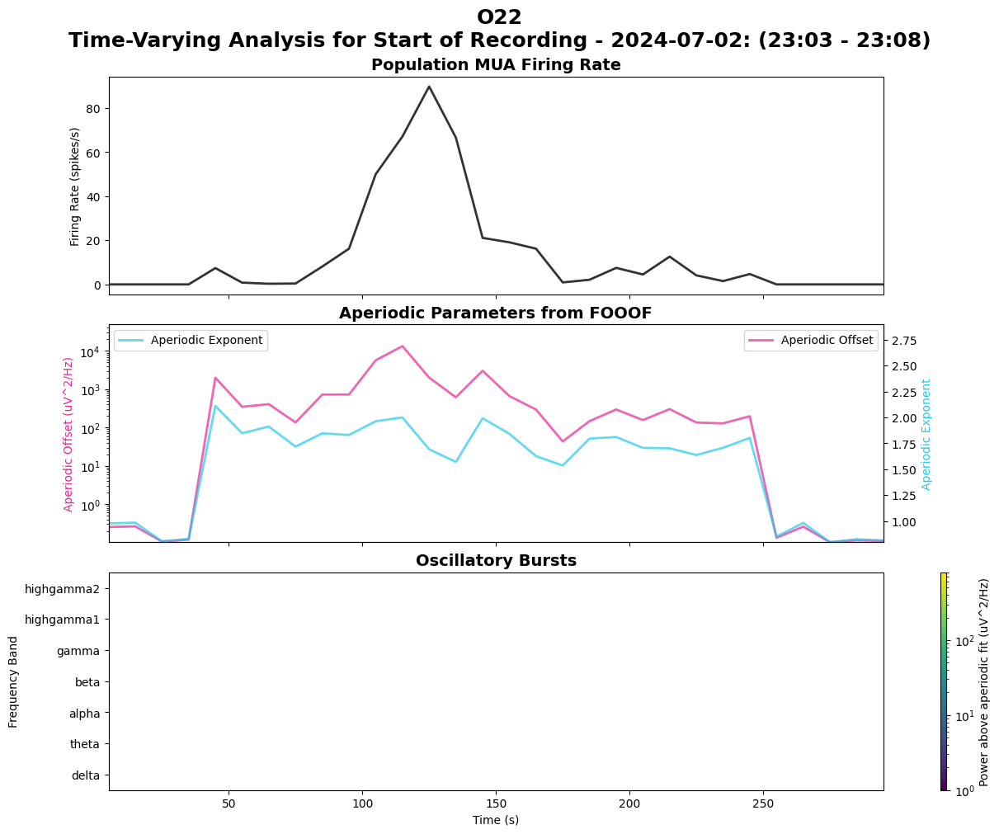

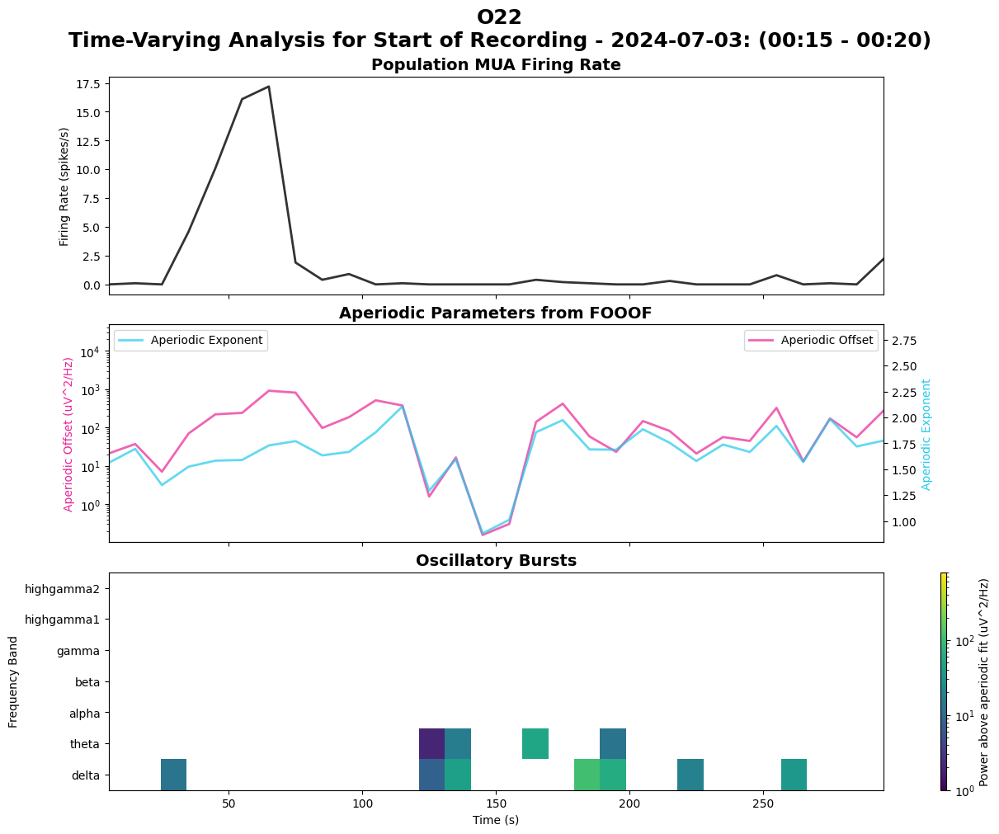

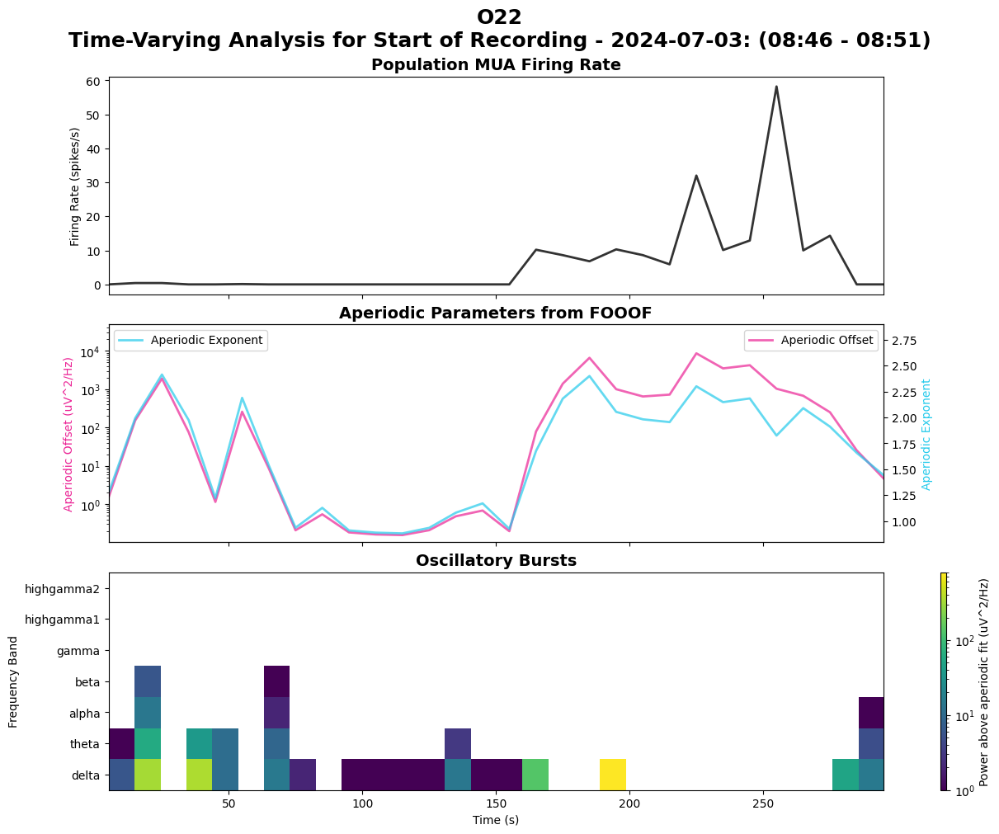

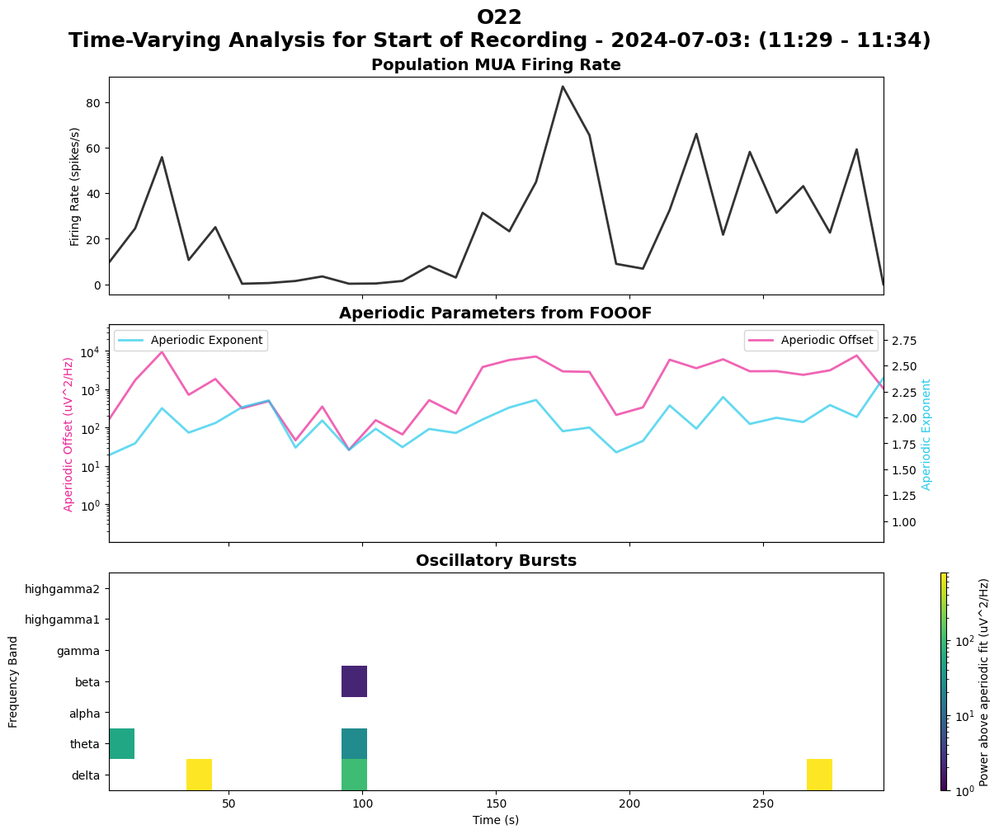

...

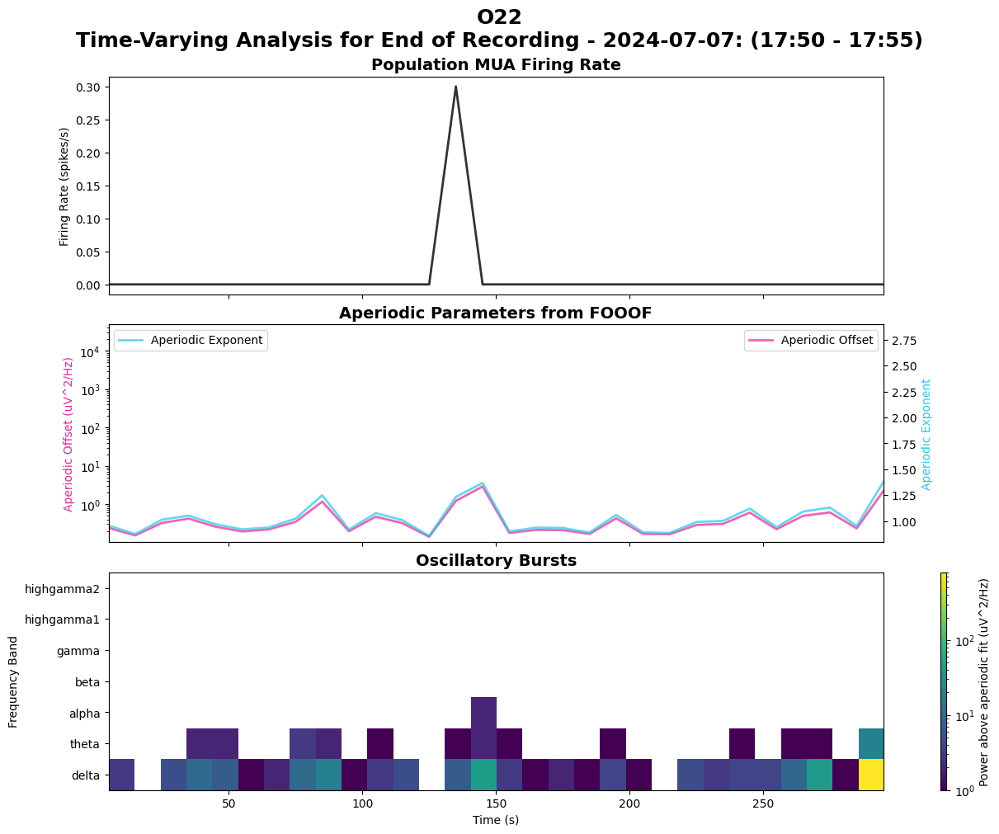

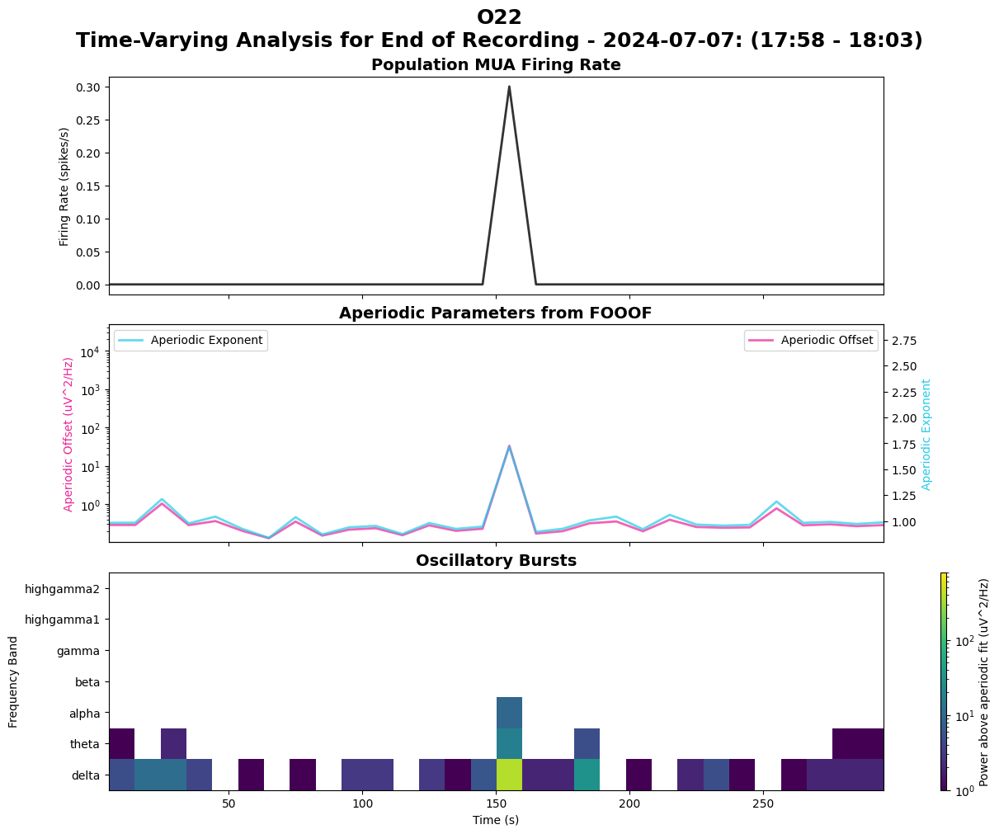

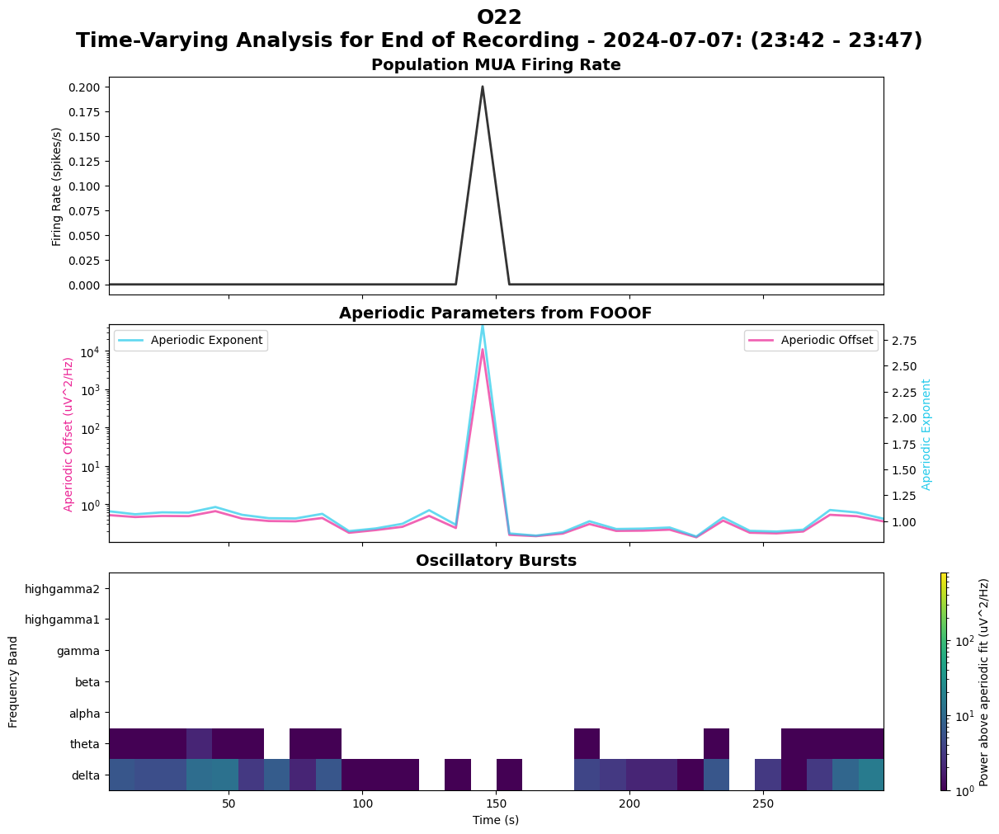

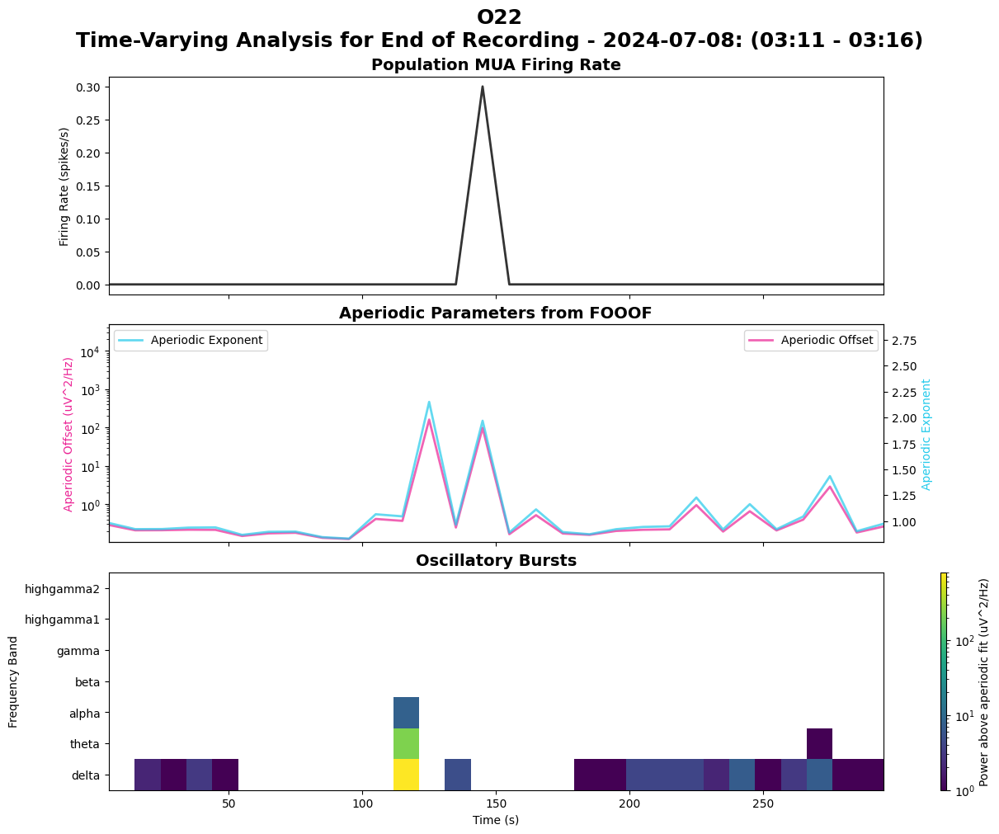

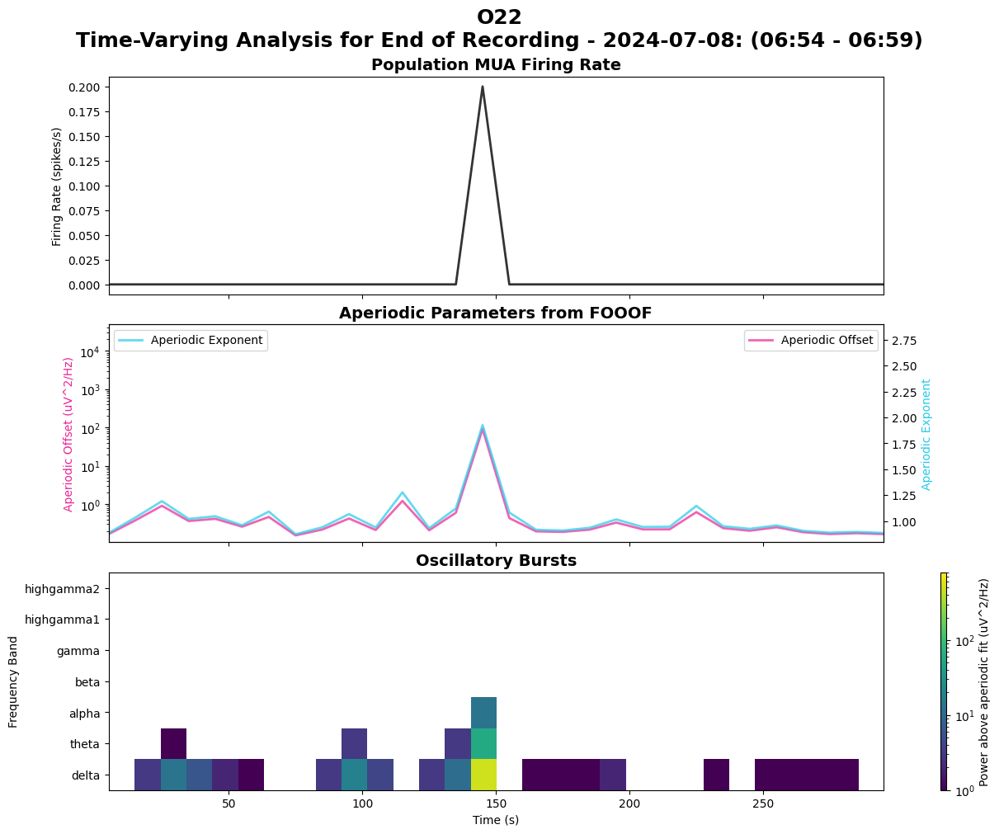

In [47]:
# Plot time varying aperiodic parameters and oscillatory activity alongside MUA for each session
# (3 x 1) figure:
# top subplot: MUA population firing rate trace
# middle subplot: aperiodic parameters (offset, exponent) as line plots with different axis values
# bottom subplot: oscillation burst image plot with heights represented as color (log scale)

dt = (analysis.FBOSCParamset * analysis.FOOOFAnalysis & session & f"fooof_param_idx = '{fooof_param_idx}'").fetch1("dt")
time = np.arange(0, (session['end_time'] - session['start_time']).total_seconds(), dt) + 5

fooof_colors = {
    "aperiodic_offset": "#EB2395",
    "aperiodic_exponent": "#23CAEB"
}

# get bounds for each plot by finding the min and max values across all sessions
aperiodic_offset_min = min([np.min(session_data["aperiodic_offset"]) for group_data in time_varying_data.values() for session_data in group_data.values()])
aperiodic_offset_max = max([np.max(session_data["aperiodic_offset"]) for group_data in time_varying_data.values() for session_data in group_data.values()])

aperiodic_exponent_min = min([np.min(session_data["aperiodic_exponent"]) for group_data in time_varying_data.values() for session_data in group_data.values()])
aperiodic_exponent_max = max([np.max(session_data["aperiodic_exponent"]) for group_data in time_varying_data.values() for session_data in group_data.values()])

all_oscillatory_values = np.concatenate([session_data["oscillatory_array"][session_data["oscillatory_array"] > 0] for group_data in time_varying_data.values() for session_data in group_data.values()])
oscillatory_min = np.min(all_oscillatory_values)
oscillatory_max = np.percentile(all_oscillatory_values, 98)

for name, sessions in session_dict.items():

    for session in sessions:
        session_title = f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"
        session_data = time_varying_data[name][session_title]

        fig, axs = plt.subplots(3, 1, figsize=(12, 10), constrained_layout=True, sharex=True)
        fig.suptitle(f"{organoid_id}\nTime-Varying Analysis for {name} - {session_title}", fontsize=18, fontweight="bold")

        # top subplot - MUA trace
        ax = axs[0]

        ax.plot(time, session_data["mua"], color="black", linewidth=2, alpha=0.8)

        ax.set_title("Population MUA Firing Rate", fontsize=14, fontweight="bold")
        ax.set_ylabel("Firing Rate (spikes/s)")

        # middle subplot - aperiodic parameters
        ax = axs[1]
        ax2 = ax.twinx()

        ax.plot(time, session_data["aperiodic_offset"], color=fooof_colors["aperiodic_offset"], label="Aperiodic Offset", linewidth=2, alpha=0.7)
        ax2.plot(time, session_data["aperiodic_exponent"], color=fooof_colors["aperiodic_exponent"], label="Aperiodic Exponent", linewidth=2, alpha=0.7)
        ax.set_ylim(aperiodic_offset_min, aperiodic_offset_max)
        ax2.set_ylim(aperiodic_exponent_min, aperiodic_exponent_max)

        ax.set_title("Aperiodic Parameters from FOOOF", fontsize=14, fontweight="bold")
        ax.set_ylabel("Aperiodic Offset (uV^2/Hz)", color=fooof_colors["aperiodic_offset"])
        ax.set_yscale("log")
        ax2.set_ylabel("Aperiodic Exponent", color=fooof_colors["aperiodic_exponent"])
        ax.legend(loc="upper right")
        ax2.legend(loc="upper left")

        # bottom subplot - oscillation bursts
        ax = axs[2]

        oscillatory_array = session_data["oscillatory_array"]
        im = ax.imshow(oscillatory_array, aspect="auto", cmap="viridis", origin="lower", extent=[time[0], time[-1], 0, oscillatory_array.shape[0]], norm=LogNorm(vmin=oscillatory_min, vmax=oscillatory_max))

        ax.set_title("Oscillatory Bursts", fontsize=14, fontweight="bold")
        ax.set_ylabel("Frequency Band")
        ax.set_xlabel("Time (s)")
        ax.set_yticks(np.arange(len(frequency_bands)) + .5)
        ax.set_yticklabels(frequency_bands.keys())
        cbar = fig.colorbar(im, ax=axs[2], pad=0.01, aspect=40)
        cbar.set_label("Power above aperiodic fit (uV^2/Hz)")

        plt.show()

In [48]:
# Get oscillation heights
oscillation_heights_data = {}
for name, sessions in session_dict.items():
    oscillation_heights_data[name] = {}

    for session in sessions:
        session_title = f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"

        oscillation_heights = {}
        for band_name in frequency_bands.keys():
            heights = (analysis.FOOOFAnalysis.FBOSCAnalysis & session & f"band_name = '{band_name}'" & f"fooof_param_idx = '{fooof_param_idx}'"
                       ).fetch1("oscillation_heights")
            oscillation_heights[band_name] = heights

        oscillation_heights_data[name][session_title] = oscillation_heights

Start of Recording - delta burst count: 9.75
Start of Recording - theta burst count: 3.75
Start of Recording - alpha burst count: 1.5
Start of Recording - beta burst count: 1.0
Start of Recording - gamma burst count: 0.25
Start of Recording - highgamma1 burst count: 0.0
Start of Recording - highgamma2 burst count: 0.0
End of Recording - delta burst count: 24.88
End of Recording - theta burst count: 15.88
End of Recording - alpha burst count: 4.12
End of Recording - beta burst count: 0.75
End of Recording - gamma burst count: 0.0
End of Recording - highgamma1 burst count: 0.0
End of Recording - highgamma2 burst count: 0.0
Start of Recording - delta burst height: 299.23
Start of Recording - theta burst height: 29.67
Start of Recording - alpha burst height: 5.75
Start of Recording - beta burst height: 2.21
Start of Recording - gamma burst height: 1.57
Start of Recording - highgamma1 burst height: nan
Start of Recording - highgamma2 burst height: nan
End of Recording - delta burst height: 

C:\Users\Organoid PC\AppData\Local\Temp\ipykernel_21700\948161325.py:51: RuntimeWarning:

Mean of empty slice

C:\Users\Organoid PC\AppData\Local\Temp\ipykernel_21700\948161325.py:54: RuntimeWarning:

Mean of empty slice



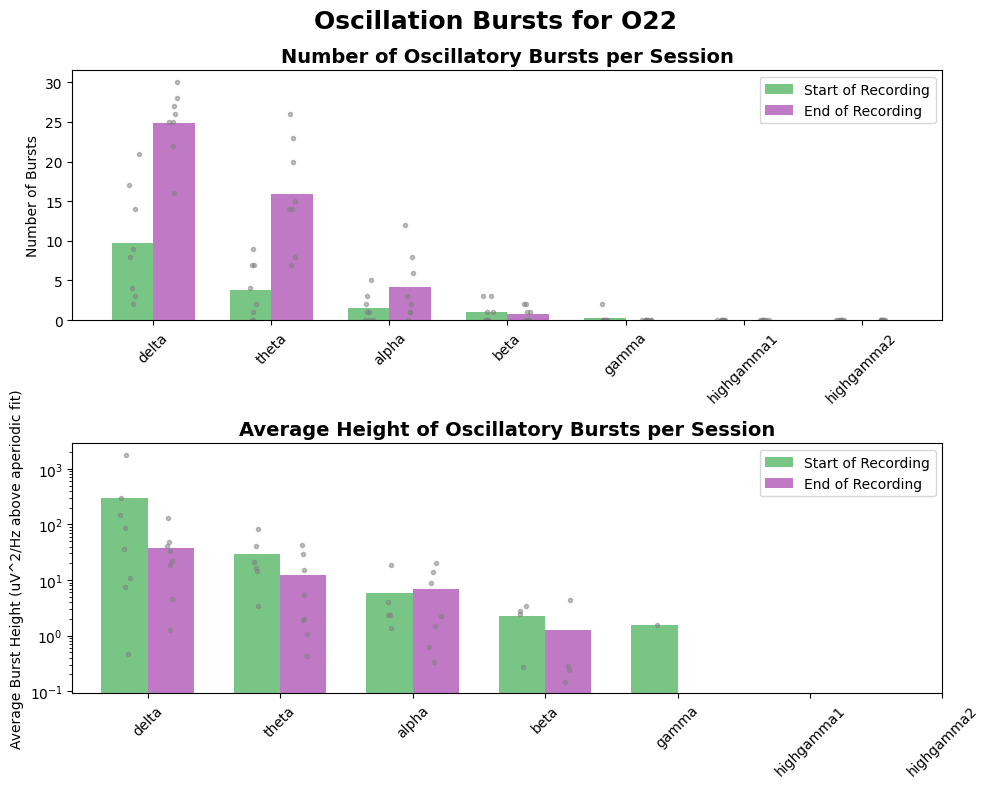

In [49]:
# Plot oscillation parameters
# 2 x 1 figure: Each subplot is a bar chart with different colored bars for each group, points for each session
# top subplot = number of oscillations for each frequency band (grouped by band, different colors for each group)
# bottom subplot = average height of oscillations for each frequency band (grouped by band, different colors for each group)

fig, axs = plt.subplots(2, 1, figsize=(10, 8), tight_layout=True)
fig.suptitle(f"Oscillation Bursts for {organoid_id}", fontsize=18, fontweight="bold")

bar_width = 0.35
# top subplot - number of oscillations
ax = axs[0]
for group_idx, (name, group_dict) in enumerate(oscillation_heights_data.items()):
    
    burst_counts = np.full((len(frequency_bands), len(group_dict)), np.nan)

    for session_idx, (session_title, session_data_dict) in enumerate(group_dict.items()):
        for band_idx, (band_name, band_data) in enumerate(session_data_dict.items()):

            burst_counts[band_idx, session_idx] = len(band_data)
    
    # print burst count values
    for band_idx, band_name in enumerate(frequency_bands.keys()):
        print(f"{name} - {band_name} burst count: {np.nanmean(burst_counts[band_idx]).round(2)}")
    
    x = np.arange(len(frequency_bands)) + (group_idx * bar_width)
    ax.bar(x, np.nanmean(burst_counts, axis=1), width=bar_width, color=group_colors[name], alpha=0.7, label=name)
    for band_idx in range(burst_counts.shape[0]):
        ax.scatter(np.random.normal(x[band_idx], 0.02, size=burst_counts.shape[1]), burst_counts[band_idx], color="grey", alpha=0.5, marker=".")
ax.set_title("Number of Oscillatory Bursts per Session", fontsize=14, fontweight="bold")
ax.set_xticks(np.arange(len(frequency_bands)) + bar_width / 2)
ax.set_xticklabels(frequency_bands.keys(), rotation=45, fontsize=10)
ax.set_ylabel("Number of Bursts")
ax.legend(loc="upper right")

# bottom subplot - average height of oscillations
ax = axs[1]
for group_idx, (name, group_dict) in enumerate(oscillation_heights_data.items()):
    
    burst_heights = np.full((len(frequency_bands), len(group_dict)), np.nan)

    for session_idx, (session_title, session_data_dict) in enumerate(group_dict.items()):
        for band_idx, (band_name, band_data) in enumerate(session_data_dict.items()):
            
            if len(band_data) == 0:
                continue

            burst_heights[band_idx, session_idx] = np.mean(band_data)
    
    # print burst height values
    for band_idx, band_name in enumerate(frequency_bands.keys()):
        print(f"{name} - {band_name} burst height: {np.nanmean(burst_heights[band_idx]).round(2)}")
    
    x = np.arange(len(frequency_bands)) + (group_idx * bar_width)
    ax.bar(x, np.nanmean(burst_heights, axis=1), width=bar_width, color=group_colors[name], alpha=0.7, label=name)
    for band_idx in range(burst_heights.shape[0]):
        ax.scatter(np.random.normal(x[band_idx], 0.02, size=burst_heights.shape[1]), burst_heights[band_idx], color="grey", alpha=0.5, marker=".")
ax.set_title("Average Height of Oscillatory Bursts per Session", fontsize=14, fontweight="bold")
ax.set_xticks(np.arange(len(frequency_bands)) + bar_width / 2)
ax.set_xticklabels(frequency_bands.keys(), rotation=45, fontsize=10)
ax.set_ylabel("Average Burst Height (uV^2/Hz above aperiodic fit)")
ax.set_yscale("log")
ax.legend(loc="upper right")

plt.show()

Coherence analysis

In [50]:
# Get coherence arrays (for electrodes inside organoid) per frequency band (averaged across sessions)
coherence_array_data = {}

frequency = (analysis.Coherence.Connectivity & session_dict["Start of Recording"][0]).fetch("f")[0]

for name, sessions in session_dict.items():
    coherence_array_data[name] = {}

    # fetch coherence and electrode data
    el_1, el_2, coh = (analysis.Coherence.Connectivity & sessions).fetch("electrode_a", "electrode_b", "coherence")
    coh = np.stack(coh)

    for band_name, (lower_freq, upper_freq) in frequency_bands.items():
        
        freq_mask = (lower_freq <= frequency) & (frequency <= upper_freq)
        coherence_array = np.zeros((num_elec_inside, num_elec_inside))

        # filter for electrodes inside organoid
        for electrode_1 in range(num_elec_inside - 1):
            for electrode_2 in range(electrode_1 + 1, num_elec_inside):
                pair_mask = ((el_1 == electrode_1) & (el_2 == electrode_2)) | ((el_1 == electrode_2) & (el_2 == electrode_1))

                if np.sum(pair_mask) != len(sessions):
                    raise ValueError(f"Electrode pair ({electrode_1}, {electrode_2}) not found in all sessions for group {name}")
                
                # filter by electrodes
                pair_coherence = coh[pair_mask, :]
                mean_coherence = np.mean(pair_coherence[:, freq_mask])
                coherence_array[electrode_2, electrode_1] = mean_coherence

        coherence_array_data[name][band_name] = coherence_array

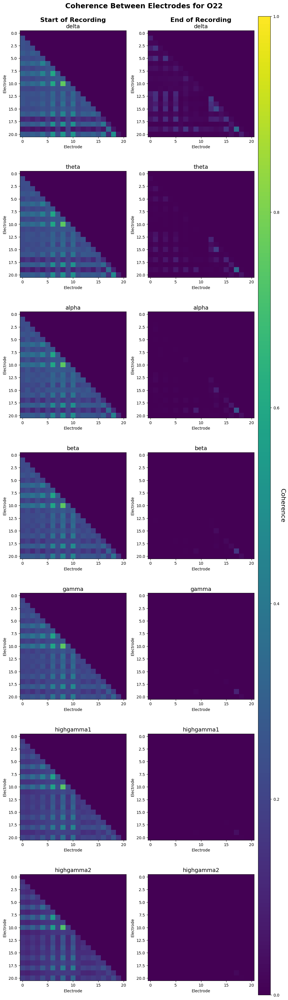

In [51]:
# Plot coherence arrays
# (num bands x num groups) figure showing coherence arrays as heatmaps for each group and frequency band (global colorbar)


fig, axs = plt.subplots(len(frequency_bands), len(coherence_array_data), figsize=(5 * len(coherence_array_data), 5 * len(frequency_bands)), constrained_layout=True)
fig.suptitle(f"Coherence Between Electrodes for {organoid_id}", fontsize=18, fontweight="bold")

coh_min = 0
coh_max = 1

for group_idx, (name, band_dict) in enumerate(coherence_array_data.items()):
    for band_idx, (band_name, coh_array) in enumerate(band_dict.items()):
        ax = axs[band_idx, group_idx]
        im = ax.imshow(coh_array, vmin=coh_min, vmax=coh_max, cmap="viridis")
        ax.set_title(band_name, fontsize=14)
        ax.set_xlabel("Electrode")
        ax.set_ylabel("Electrode")
cbar = fig.colorbar(im, ax=axs, orientation="vertical", pad=.01, aspect=80)
cbar.set_label("Coherence", rotation=270, labelpad=15, fontsize=16)

# add text annotating group name at the top of each column
for group_idx, name in enumerate(coherence_array_data.keys()):
    axs[0, group_idx].text(0.5, 1.07, name, transform=axs[0, group_idx].transAxes, ha="center", va="bottom", fontsize=16, fontweight="bold")

plt.show()


In [52]:
# Get average coherence across all pairs per electrode (average across sessions)
average_coherence_data = {}

for name, sessions in session_dict.items():

    # fetch coherence and electrode data
    el_1, el_2, coh = (analysis.Coherence.Connectivity & sessions).fetch("electrode_a", "electrode_b", "coherence")
    coh = np.stack(coh)

    group_coherence_array = []
    for elec in range(num_elec_inside):
        elec_mask = ((el_1 == elec) | (el_2 == elec)) & ((el_1 < num_elec_inside) & (el_2 < num_elec_inside))

        if np.sum(elec_mask) != len(sessions) * (num_elec_inside - 1):
            raise ValueError(f"Electrode {elec} does not have coherence data for all pairs in all sessions for group {name}")

        mean_coherence = np.mean(coh[elec_mask, :], axis=0)
        group_coherence_array.append(mean_coherence)

    average_coherence_data[name] = np.array(group_coherence_array)

Start of Recording - delta coherence: 0.25
Start of Recording - theta coherence: 0.25
Start of Recording - alpha coherence: 0.26
Start of Recording - beta coherence: 0.25
Start of Recording - gamma coherence: 0.25
Start of Recording - highgamma1 coherence: 0.22
Start of Recording - highgamma2 coherence: 0.18
End of Recording - delta coherence: 0.04
End of Recording - theta coherence: 0.01
End of Recording - alpha coherence: 0.01
End of Recording - beta coherence: 0.0
End of Recording - gamma coherence: 0.0
End of Recording - highgamma1 coherence: 0.0
End of Recording - highgamma2 coherence: 0.0


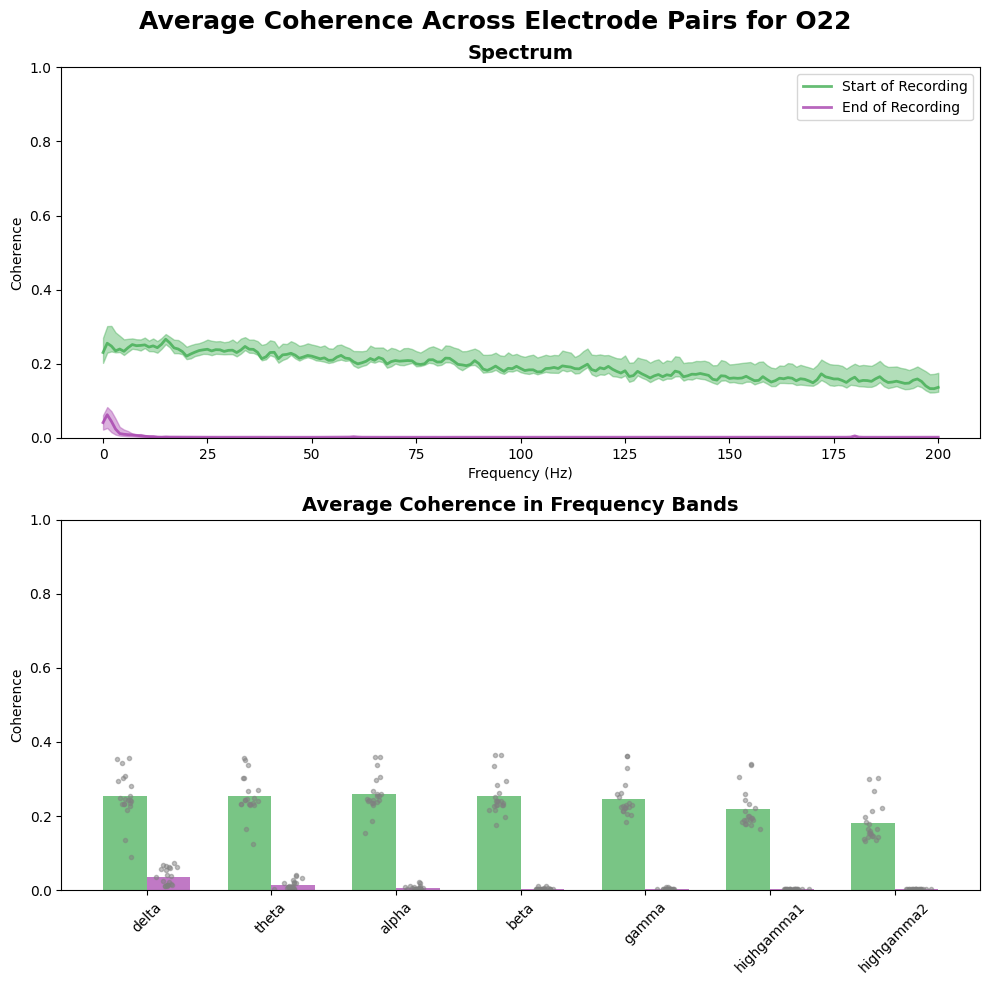

In [53]:
# Plot average coherence across all pairs (median = line, IQR = shaded area) for each group
# (2x1) figure, bottom subplot contains frequency band coherence values (bar plot with points for each electrode)

fig, axs = plt.subplots(2, 1, figsize=(10, 10), tight_layout=True, sharey=True)
fig.suptitle(f"Average Coherence Across Electrode Pairs for {organoid_id}", fontsize=18, fontweight="bold")

for name, coherence_array in average_coherence_data.items():
    ax = axs[0]
    median_coherence = np.median(coherence_array, axis=0)
    q1_coherence = np.percentile(coherence_array, 25, axis=0)
    q3_coherence = np.percentile(coherence_array, 75, axis=0)

    ax.plot(frequency, median_coherence, label=name, color=group_colors[name], linewidth=2, alpha=0.8)
    ax.fill_between(frequency, q1_coherence, q3_coherence, color=group_colors[name], alpha=0.4)

    ax = axs[1]
    for band_idx, (band_name, (lower_freq, upper_freq)) in enumerate(frequency_bands.items()):
        freq_mask = (lower_freq <= frequency) & (frequency <= upper_freq)

        band_coherence = np.mean(coherence_array[:, freq_mask], axis=1)
        x = band_idx + (list(average_coherence_data.keys()).index(name) * bar_width)

        ax.bar(x, np.mean(band_coherence), width=bar_width, color=group_colors[name], alpha=0.7, label=name if band_idx == 0 else "")
        ax.scatter(np.random.normal(x, 0.04, size=band_coherence.shape[0]), band_coherence, color="grey", alpha=0.5, marker=".")

        # print coherence values
        print(f"{name} - {band_name} coherence: {np.mean(band_coherence).round(2)}")

ax = axs[0]
ax.set_title("Spectrum", fontsize=14, fontweight="bold")
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Coherence")
ax.set_ylim(0, 1)
ax.legend(loc="upper right")

ax = axs[1]
ax.set_title("Average Coherence in Frequency Bands", fontsize=14, fontweight="bold")
ax.set_xticks(np.arange(len(frequency_bands)) + bar_width / 2)
ax.set_xticklabels(frequency_bands.keys(), rotation=45, fontsize=10)
ax.set_ylabel("Coherence")
ax.set_ylim(0, 1)

plt.show()

In [54]:
# Get data across distance (averaged across sessions)
distance_coherence_data = {}

for name, sessions in session_dict.items():

    # fetch coherence and electrode data
    el_1, el_2, coh = (analysis.Coherence.Connectivity & sessions).fetch("electrode_a", "electrode_b", "coherence")
    coh = np.stack(coh)

    unique_pairs = np.unique([el_1, el_2], axis=1)
    unique_pair_distances = np.squeeze(np.diff(unique_pairs, axis=0)) * 100
    unique_distances = np.unique(unique_pair_distances)

    group_coherence = []
    for distance in unique_distances:

        # get mean coherence per electrode pair
        distance_pairs = unique_pairs[:, unique_pair_distances == distance]

        distance_coherence = []
        for pair in distance_pairs.T:
            pair_mask = (el_1 == pair[0]) & (el_2 == pair[1])

            distance_coherence.append(np.mean(coh[pair_mask, :], axis=0))
        group_coherence.append(distance_coherence)

    distance_coherence_data[name] = group_coherence

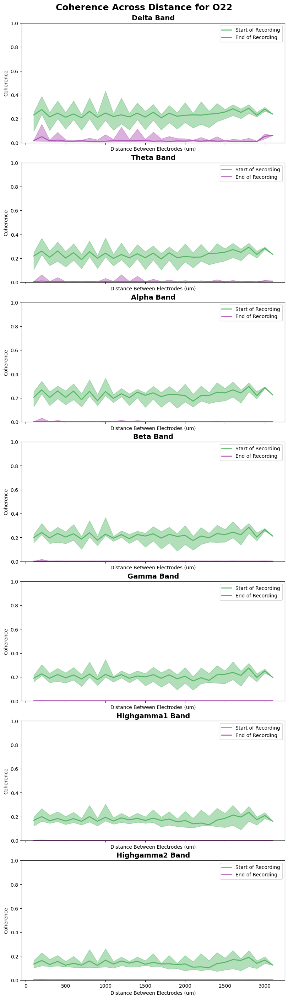

In [55]:
# For each frequency band, plot coherence across distance for each group (median = line, IQR = shaded area)
min_pairs = 1 # set minimum number of pairs to plot coherence for a distance bin

fig, axs = plt.subplots(len(frequency_bands), 1, figsize=(8, 4 * len(frequency_bands)), constrained_layout=True, sharex=True, sharey=True)
fig.suptitle(f"Coherence Across Distance for {organoid_id}", fontsize=18, fontweight="bold")

for band_idx, (band_name, (lower_freq, upper_freq)) in enumerate(frequency_bands.items()):
    
    ax = axs[band_idx]
    for name, group_coherence in distance_coherence_data.items():

        median_coherence = []
        q1_coherence = []
        q3_coherence = []
        for distance_idx, distance in enumerate(unique_distances):
            distance_coherence = np.array(group_coherence[distance_idx]) # shape = (num pairs, num frequencies)

            if distance_coherence.shape[0] < min_pairs:
                continue

            # filter for frequencies in band
            freq_mask = (lower_freq <= frequency) & (frequency <= upper_freq)
            band_coherence = np.mean(distance_coherence[:, freq_mask], axis=1)

            median_coherence.append(np.median(band_coherence))
            q1_coherence.append(np.percentile(band_coherence, 25))
            q3_coherence.append(np.percentile(band_coherence, 75))

        ax.plot(unique_distances, median_coherence, label=name, color=group_colors[name], linewidth=2, alpha=0.8)
        ax.fill_between(unique_distances, q1_coherence, q3_coherence, color=group_colors[name], alpha=0.4)

    ax.set_title(f"{band_name.capitalize()} Band", fontsize=14, fontweight="bold")
    ax.set_xlabel("Distance Between Electrodes (um)")
    ax.set_ylabel("Coherence")
    ax.set_ylim(0, 1)
    ax.legend(loc="upper right")

In [56]:
# Get coherence between lfp signal and frequency band trace per electrode (averaged across sessions)

synchrony_data = {}
frequency = (analysis.Coherence.Synchrony & session_dict["Start of Recording"][0]).fetch("f")[0]

for name, sessions in session_dict.items():

    # fetch coherence, electrode, and frequency band data
    el, band_name, coh = (analysis.Coherence.Synchrony & sessions).fetch("electrode", "band_name", "synchrony")
    coh = np.stack(coh)

    for band in frequency_bands.keys():
        band_mask = (band_name == band)
        
        for elec in range(num_elec_inside):
            elec_mask = (el == elec)

            pair_mask = band_mask & elec_mask

            if np.sum(pair_mask) != len(sessions):
                raise ValueError(f"Electrode {elec} and band {band} do not have synchrony data for all sessions for group {name}")

            mean_synchrony = np.mean(coh[pair_mask, :], axis=0)

            synchrony_data.setdefault(name, {}).setdefault(band, []).append(mean_synchrony)
    
        synchrony_data[name][band] = np.array(synchrony_data[name][band])   

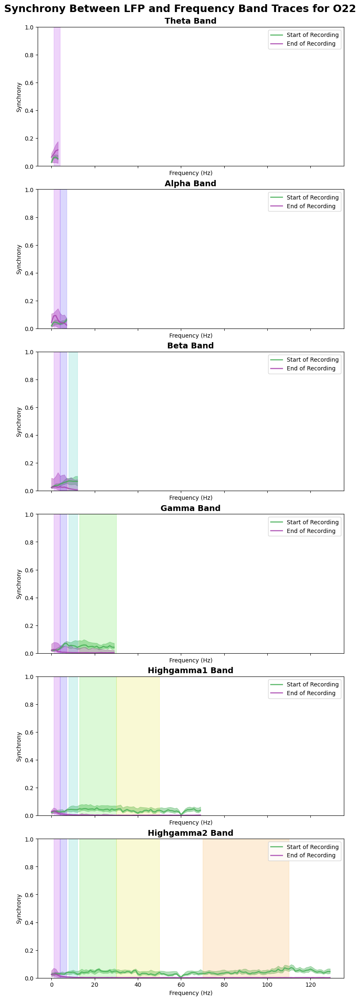

In [57]:
# Plot coherence (synchrony) 
# (num bands x 1) figure showing synchrony between LFP and frequency band trace for each group and frequency band (median = line, IQR = shaded area)
# shade frequency band ranges acording to band_colors dict

fig, axs = plt.subplots(len(frequency_bands)-1, 1, figsize=(8, 4 * (len(frequency_bands)-1)), constrained_layout=True, sharex=True, sharey=True)
fig.suptitle(f"Synchrony Between LFP and Frequency Band Traces for {organoid_id}", fontsize=18, fontweight="bold")

for band_idx, (band_name, (lower_freq, upper_freq)) in enumerate(frequency_bands.items()):
    if band_name == "delta":
        continue # skip delta band since it's two low to be an amplitude trace

    ax = axs[band_idx-1]
    for name, group_synchrony in synchrony_data.items():

        # only plot synchrony data for frequencies lower than the band
        band_synchrony = group_synchrony[band_name][:, frequency < lower_freq]
        band_frequency = frequency[frequency < lower_freq]

        median_synchrony = np.median(band_synchrony, axis=0)
        q1_synchrony = np.percentile(band_synchrony, 25, axis=0)
        q3_synchrony = np.percentile(band_synchrony, 75, axis=0)

        ax.plot(band_frequency, median_synchrony, label=name, color=group_colors[name], linewidth=2, alpha=0.8)
        ax.fill_between(band_frequency, q1_synchrony, q3_synchrony, color=group_colors[name], alpha=0.4)

    # shade frequency band regions
    for other_band_name, (low_freq, high_freq) in frequency_bands.items():
        if frequency_bands[other_band_name][1] <= lower_freq:
            ax.axvspan(low_freq, high_freq, color=band_colors[other_band_name], alpha=0.2)   

    ax.set_title(f"{band_name.capitalize()} Band", fontsize=14, fontweight="bold")
    ax.set_xlabel("Frequency (Hz)")
    ax.set_ylabel("Synchrony")
    ax.set_ylim(0, 1)
    ax.legend(loc="upper right")

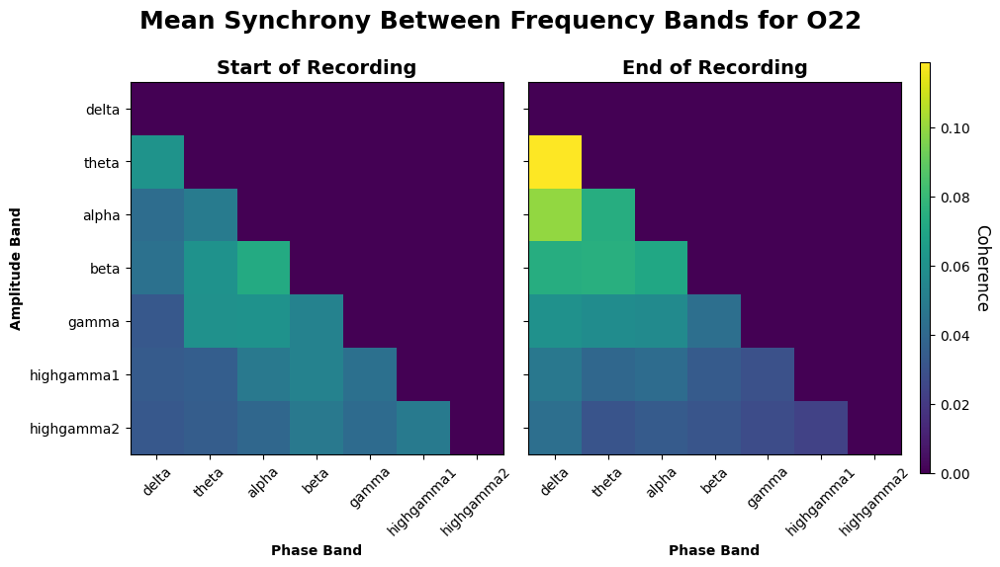

In [58]:
# Plot mean inter-band synchrony for each group
# (1 x num groups) figure with an image plot (num bands x num bands) showing mean synchrony between each pair of frequency bands for each group (global colorbar)

fig, axs = plt.subplots(1, len(synchrony_data), figsize=(5 * len(synchrony_data), 5), constrained_layout=True, sharey=True)  
fig.suptitle(f"Mean Synchrony Between Frequency Bands for {organoid_id}", fontsize=18, fontweight="bold", y=1.1)

synchrony_matrices = {}
for group_idx, (name, group_dict) in enumerate(synchrony_data.items()):
    
    mean_synchrony_matrix = np.zeros((len(frequency_bands), len(frequency_bands)))

    for i, (amp_band, _) in enumerate(frequency_bands.items()):
        for j, (phase_band, (lower_freq, upper_freq)) in enumerate(frequency_bands.items()):
            if i <= j:
                continue # only fill lower triangle of matrix since it's symmetric

            band_coherence = group_dict[amp_band]
            mean_coherence = np.mean(band_coherence[:, (lower_freq <= frequency) & (frequency <= upper_freq)])

            mean_synchrony_matrix[i, j] = mean_coherence
    synchrony_matrices[name] = mean_synchrony_matrix

# find global min and max synchrony values across all groups for color scaling
all_synchrony_values = np.concatenate([matrix[np.tril_indices(len(frequency_bands), k=-1)] for matrix in synchrony_matrices.values()])
vmin = 0
vmax = np.max(all_synchrony_values)

for group_idx, (name, mean_synchrony_matrix) in enumerate(synchrony_matrices.items()):
    im = axs[group_idx].imshow(mean_synchrony_matrix, vmin=vmin, vmax=vmax, cmap="viridis")
    axs[group_idx].set_title(name, fontsize=14, fontweight="bold")
    axs[group_idx].set_xticks(np.arange(len(frequency_bands)))
    axs[group_idx].set_xticklabels(frequency_bands.keys(), rotation=45, fontsize=10)
    axs[group_idx].set_yticks(np.arange(len(frequency_bands)))
    axs[group_idx].set_yticklabels(frequency_bands.keys(), fontsize=10)
    axs[group_idx].set_xlabel("Phase Band", fontweight="bold")
axs[0].set_ylabel("Amplitude Band", fontweight="bold")

cbar = fig.colorbar(im, ax=axs, orientation="vertical", pad=.01, aspect=40)
cbar.set_label("Coherence", rotation=270, labelpad=15, fontsize=12)

plt.show()

In [59]:
raise

RuntimeError: No active exception to reraise

Cross Frequency Coupling

In [ ]:
band_param_idx = 3
f_pha, f_amp = (analysis.PhaseAmplitudeBands & f"band_param_idx = {band_param_idx}").fetch1("f_pha", "f_amp")

# get phase and amplitude vectors (mean of each range)
pha_vec = np.array([(low + high) / 2 for low, high in f_pha])
amp_vec = np.array([(low + high) / 2 for low, high in f_amp])

[2026-03-19 12:42:32,279][WARNING]: Reconnecting to MySQL server.


In [ ]:
# Get PAC averaged across sessions and electrodes for each group
pac_data = {}

for name, sessions in session_dict.items():

    # fetch PAC data
    pac_arrays = (analysis.PhaseAmplitudeCoupling & sessions).fetch("pac_array") # amp_vec x pha_vec x num_epochs

    if len(pac_arrays) != len(sessions) * num_elec_inside:
        raise ValueError(f"Number of PAC arrays does not match number of sessions and electrodes for group {name}")
    
    mean_pac_array = np.mean(np.concatenate(pac_arrays, axis=2), axis=2) # average across epochs, sessions, and electrodes

    pac_data[name] = mean_pac_array

[2026-03-19 14:06:05,147][WARNING]: Reconnecting to MySQL server.


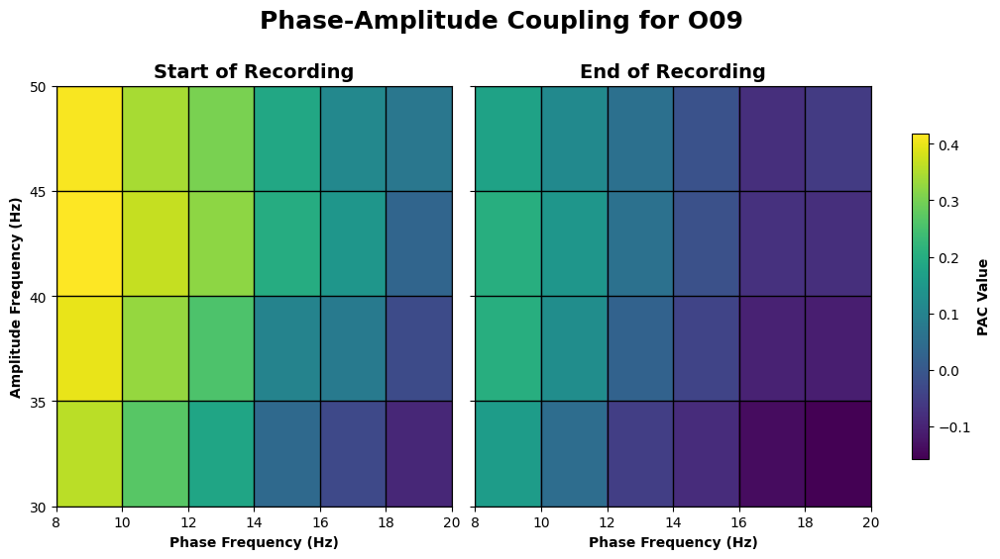

In [ ]:
# Plot PAC array
# (1 x num groups) figure with each subplot being a pha_vec x amp_vec image plot of PAC values for each group (global colorbar)

fig, axs = plt.subplots(1, len(pac_data), figsize=(5 * len(pac_data), 5), constrained_layout=True, sharey=True)
fig.suptitle(f"Phase-Amplitude Coupling for {organoid_id}", fontsize=18, fontweight="bold", y=1.1)

# find global min and max PAC values across all groups for color scaling
all_pac_values = np.concatenate([data.flatten() for data in pac_data.values()])
vmin = np.min(all_pac_values)
vmax = np.max(all_pac_values)

for group_idx, (name, pac_array) in enumerate(pac_data.items()):
    im = axs[group_idx].imshow(pac_array, vmin=vmin, vmax=vmax, cmap="viridis", aspect="auto", origin="lower", extent=[f_pha[0][0], f_pha[-1][1], f_amp[0][0], f_amp[-1][1]])
    axs[group_idx].set_title(name, fontsize=14, fontweight="bold")
    axs[group_idx].set_xlabel("Phase Frequency (Hz)", fontweight="bold")
    axs[group_idx].set_yticks(np.sort(np.unique(np.array(f_amp).flatten())))

    if group_idx == 0:
        axs[group_idx].set_ylabel("Amplitude Frequency (Hz)", fontweight="bold")

# add colorbar
cbar = fig.colorbar(im, ax=axs, orientation="vertical", fraction=0.02, pad=0.04)
cbar.set_label("PAC Value", fontweight="bold")

# turn grid on
for ax in axs:
    ax.grid(True, color="black", linestyle="-", linewidth=1)

In [ ]:
# Get PAC averaged across sessions and electrodes for each group
pvalue_data = {}

for name, sessions in session_dict.items():

    # fetch PAC data
    pvalue_arrays = (analysis.PhaseAmplitudeCoupling & sessions).fetch("pvalues") # amp_vec x pha_vec x num_epochs

    if len(pac_arrays) != len(sessions) * num_elec_inside:
        raise ValueError(f"Number of PAC arrays does not match number of sessions and electrodes for group {name}")
    
    mean_pvalue_array = np.mean(np.stack(pvalue_arrays, axis=2), axis=2) # average across epochs, sessions, and electrodes

    pvalue_data[name] = mean_pvalue_array

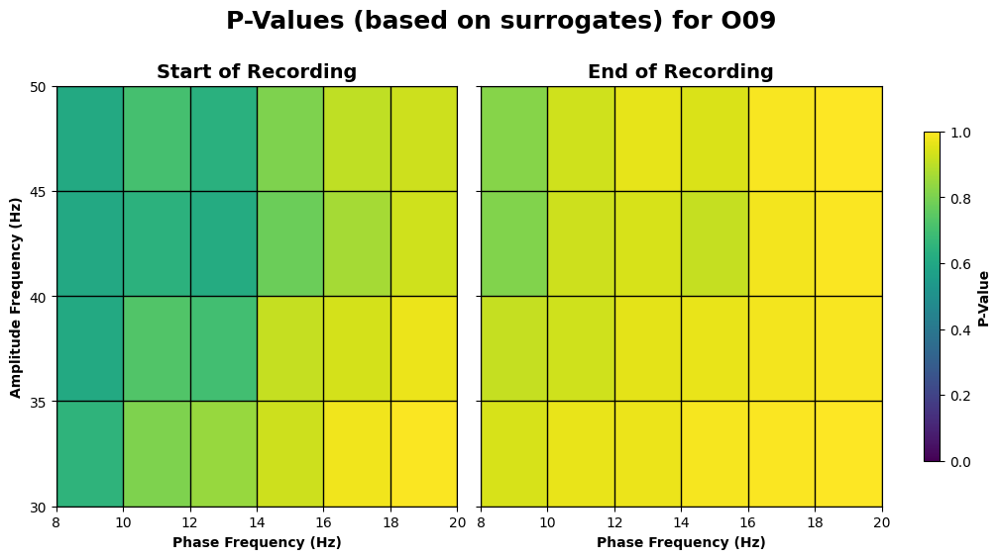

In [ ]:
# Plot PAC array
# (1 x num groups) figure with each subplot being a pha_vec x amp_vec image plot of PAC values for each group (global colorbar)

fig, axs = plt.subplots(1, len(pvalue_data), figsize=(5 * len(pvalue_data), 5), constrained_layout=True, sharey=True)
fig.suptitle(f"P-Values (based on surrogates) for {organoid_id}", fontsize=18, fontweight="bold", y=1.1)

# find global min and max PAC values across all groups for color scaling
all_pvalue_values = np.concatenate([data.flatten() for data in pvalue_data.values()])
vmin = 0
vmax = np.max(all_pvalue_values)

for group_idx, (name, pvalue_array) in enumerate(pvalue_data.items()):
    im = axs[group_idx].imshow(pvalue_array, vmin=vmin, vmax=vmax, cmap="viridis", aspect="auto", origin="lower", extent=[f_pha[0][0], f_pha[-1][1], f_amp[0][0], f_amp[-1][1]])
    axs[group_idx].set_title(name, fontsize=14, fontweight="bold")
    axs[group_idx].set_xlabel("Phase Frequency (Hz)", fontweight="bold")
    axs[group_idx].set_yticks(np.sort(np.unique(np.array(f_amp).flatten())))

    if group_idx == 0:
        axs[group_idx].set_ylabel("Amplitude Frequency (Hz)", fontweight="bold")

# add colorbar
cbar = fig.colorbar(im, ax=axs, orientation="vertical", fraction=0.02, pad=0.04)
cbar.set_label("P-Value", fontweight="bold")

# turn grid on
for ax in axs:
    ax.grid(True, color="black", linestyle="-", linewidth=1)

In [ ]:
# Get PAC data across sessions
pac_session_data = {}

for name, sessions in session_dict.items():

    group_pac_data = []
    for session in sessions:
        session_title = f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"

        # fetch PAC data
        pac_arrays = (analysis.PhaseAmplitudeCoupling & session).fetch("pac_array") # amp_vec x pha_vec x num_epochs

        if len(pac_arrays) != num_elec_inside:
            raise ValueError(f"Number of PAC arrays does not match number of electrodes for session {session_title} and group {name}")
        
        # stack pac arrays
        pac_arrays = np.stack(pac_arrays) # num_electrodes x amp_vec x pha_vec x num_epochs
        mean_values = np.mean(pac_arrays, axis=(1, 2, 3)) # average PAC values across amplitude and phase frequencies and epochs for each electrode

        group_pac_data.append(mean_values)
    pac_session_data[name] = np.array(group_pac_data) # num_sessions x num_electrodes

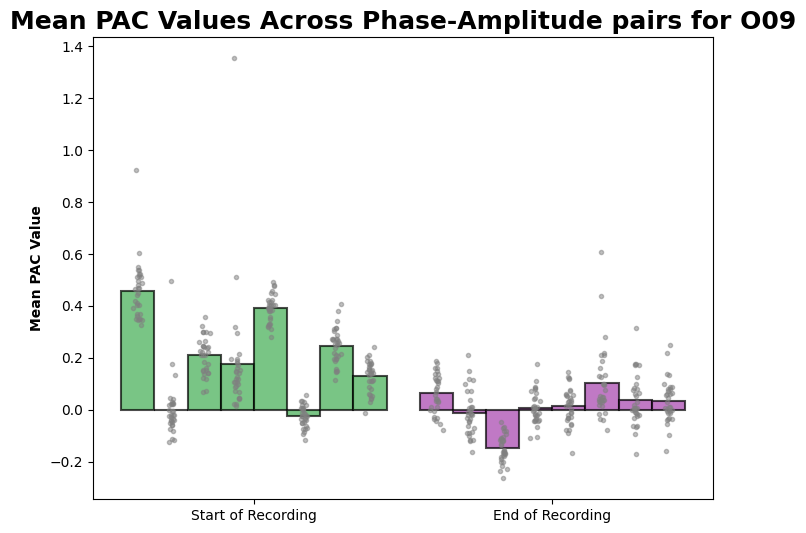

In [ ]:
# Plot session specific PAC values as a bar plot with points for each electrode (different colors for each group)
# plot bars of the same group adjacent to each other with group names as x ticks

fig, ax = plt.subplots(figsize=(8, 6))
bar_width = 0.35
num_sessions_per_group = max([data.shape[0] for data in pac_session_data.values()])

x_ticks = []
for group_idx, (name, group_data) in enumerate(pac_session_data.items()):
    x = np.arange(num_sessions_per_group)*bar_width + (group_idx * num_sessions_per_group * bar_width) + bar_width*group_idx

    mean_pac_values = np.mean(group_data, axis=1) # average across electrodes for each session
    ax.bar(x, mean_pac_values, width=bar_width, color=group_colors[name], alpha=0.7, label=name, edgecolor="black", linewidth=1.5)

    for session_idx in range(group_data.shape[0]):
        session_pac_values = group_data[session_idx, :] # PAC values for each electrode in session
        ax.scatter(np.random.normal(x[session_idx], 0.02, size=session_pac_values.shape[0]), session_pac_values, color="grey", alpha=0.5, marker=".")
    
    x_ticks.append(np.mean(x))

ax.set_title(f"Mean PAC Values Across Phase-Amplitude pairs for {organoid_id}", fontsize=18, fontweight="bold")
ax.set_ylabel("Mean PAC Value", fontweight="bold")
ax.set_xticks(x_ticks)
ax.set_xticklabels(pac_session_data.keys(), fontsize=10)

plt.show()


In [ ]:
# Get z-scored PAC values
zscore_pac_data = {}

for name, sessions in session_dict.items():

    group_pac_data = []
    for session in sessions:
        session_title = f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"

        # fetch PAC data
        pac_arrays = (analysis.PhaseAmplitudeCoupling & session).fetch("pac_array") # amp_vec x pha_vec x num_epochs

        if len(pac_arrays) != num_elec_inside:
            raise ValueError(f"Number of PAC arrays does not match number of electrodes for session {session_title} and group {name}")
        
        # stack pac arrays
        pac_arrays = np.stack(pac_arrays) # num_electrodes x amp_vec x pha_vec x num_epochs
        mean_pac_values = np.mean(pac_arrays, axis=(0, 3)) # average PAC values across electrodes and epochs for each amplitude and phase frequency pair

        # get z-score
        mean = np.mean(mean_pac_values)
        std = np.std(mean_pac_values)
        zscore_values = (mean_pac_values - mean) / std

        group_pac_data.append(zscore_values)
    zscore_pac_data[name] = np.array(group_pac_data) # num_sessions x amp_vec x pha_vec

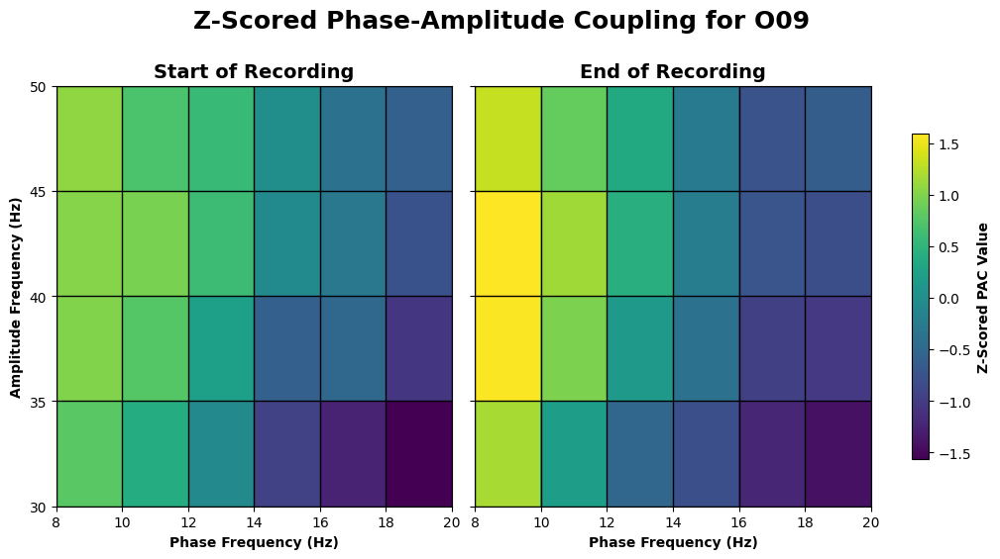

In [ ]:
# Plot the average z-scored PAC values across sessions for each group as an image plot (pha_vec x amp_vec) with a global colorbar

fig, axs = plt.subplots(1, len(zscore_pac_data), figsize=(5 * len(zscore_pac_data), 5), constrained_layout=True, sharey=True)
fig.suptitle(f"Z-Scored Phase-Amplitude Coupling for {organoid_id}", fontsize=18, fontweight="bold", y=1.1)

# find global min and max PAC values across all groups for color scaling
all_zscore_values = np.concatenate([np.mean(data, axis=0).flatten() for data in zscore_pac_data.values()])
vmin = np.min(all_zscore_values)
vmax = np.max(all_zscore_values)

for group_idx, (name, zscore_array) in enumerate(zscore_pac_data.items()):
    mean_zscore_array = np.mean(zscore_array, axis=0) # average across sessions
    im = axs[group_idx].imshow(mean_zscore_array, vmin=vmin, vmax=vmax, cmap="viridis", aspect="auto", origin="lower", extent=[f_pha[0][0], f_pha[-1][1], f_amp[0][0], f_amp[-1][1]])
    axs[group_idx].set_title(name, fontsize=14, fontweight="bold")
    axs[group_idx].set_xlabel("Phase Frequency (Hz)", fontweight="bold")
    axs[group_idx].set_yticks(np.sort(np.unique(np.array(f_amp).flatten())))

    if group_idx == 0:
        axs[group_idx].set_ylabel("Amplitude Frequency (Hz)", fontweight="bold")

# add colorbar
cbar = fig.colorbar(im, ax=axs, orientation="vertical", fraction=0.02, pad=0.04)
cbar.set_label("Z-Scored PAC Value", fontweight="bold")

# turn grid on
for ax in axs:
    ax.grid(True, color="black", linestyle="-", linewidth=1)

plt.show()

In [ ]:
# Get session specific pac arrays (averaged across electrodes) 
pac_session_array_data = {}

for name, sessions in session_dict.items():
    for session in sessions:

        # fetch PAC data
        pac_arrays = (analysis.PhaseAmplitudeCoupling & session).fetch("pac_array") # amp_vec x pha_vec x num_epochs

        if len(pac_arrays) != num_elec_inside:
            raise ValueError(f"Number of PAC arrays does not match number of electrodes for session {session['start_time']} and group {name}")
        
        # stack pac arrays
        pac_arrays = np.stack(pac_arrays) # num_electrodes x amp_vec x pha_vec x num_epochs
        mean_pac_array = np.mean(pac_arrays, axis=(0, 3)) # average across electrodes and epochs

        session_title = f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"
        pac_session_array_data.setdefault(name, {})[session_title] = mean_pac_array

[2026-03-19 14:15:28,166][WARNING]: Reconnecting to MySQL server.


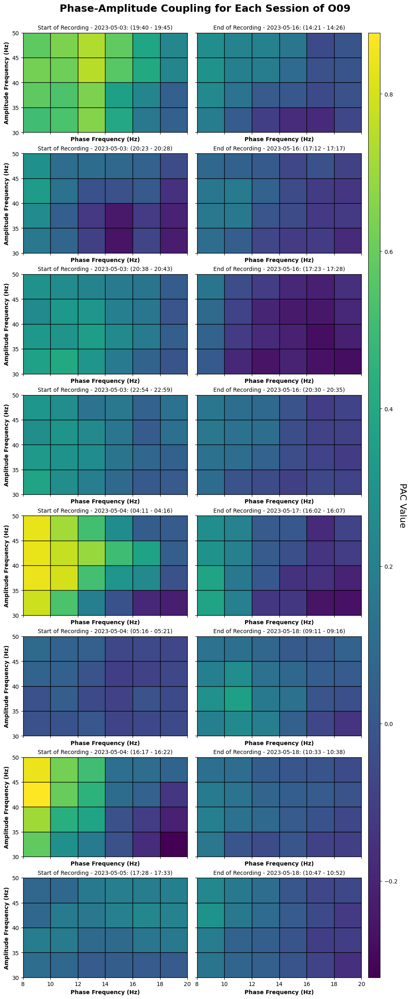

In [ ]:
# Plot PAC session arrays
# (num sessions x num groups) figure with each subplot being a pha_vec x amp_vec image plot of PAC values for each session and group (global colorbar)

fig, axs = plt.subplots(len(session_dict["Start of Recording"]), len(pac_session_array_data), figsize=(5 * len(pac_session_array_data), 3 * len(session_dict["Start of Recording"])), constrained_layout=True, sharex=True, sharey=True)
fig.suptitle(f"Phase-Amplitude Coupling for Each Session of {organoid_id}", fontsize=18, fontweight="bold", y=1.02)

# find global min and max PAC values across all groups and sessions for color scaling
all_session_pac_values = np.concatenate([data.flatten() for group_data in pac_session_array_data.values() for data in group_data.values()])
vmin = np.min(all_session_pac_values)
vmax = np.max(all_session_pac_values)

for group_idx, (name, group_data) in enumerate(pac_session_array_data.items()):
    for session_idx, (session_title, pac_array) in enumerate(group_data.items()):
        ax = axs[session_idx, group_idx]
        im = ax.imshow(pac_array, vmin=vmin, vmax=vmax, cmap="viridis", aspect="auto", origin="lower", extent=[f_pha[0][0], f_pha[-1][1], f_amp[0][0], f_amp[-1][1]])
        ax.set_title(f"{name} - {session_title}", fontsize=10)
        ax.set_xlabel("Phase Frequency (Hz)", fontweight="bold")
        ax.set_yticks(np.sort(np.unique(np.array(f_amp).flatten())))

        if group_idx == 0:
            ax.set_ylabel("Amplitude Frequency (Hz)", fontweight="bold")

# add colorbar
cbar = fig.colorbar(im, ax=axs, orientation="vertical", pad=.01, aspect=80)
cbar.set_label("PAC Value", rotation=270, labelpad=15, fontsize=16)

# turn grid on
for ax in axs.flatten():
    ax.grid(True, color="black", linestyle="-", linewidth=1)

plt.show()

In [ ]:
# Get PAC data (averages across pairs) across time for each session (keep electrodes)
pac_time_data = {}

# fetch dt
dt = (analysis.TensorpacParamset & "tensorpac_param_idx = 0").fetch1("dt")

for name, sessions in session_dict.items():

    for session in sessions:

        # fetch PAC data
        pac_arrays = (analysis.PhaseAmplitudeCoupling & session).fetch("pac_array") # amp_vec x pha_vec x num_epochs

        if len(pac_arrays) != num_elec_inside:
            raise ValueError(f"Number of PAC arrays does not match number of electrodes for session {session['start_time']} and group {name}")
        
        # stack pac arrays
        pac_arrays = np.stack(pac_arrays) # num_electrodes x amp_vec x pha_vec x num_epochs
        mean_pac_array = np.mean(pac_arrays, axis=(1,2)) # average across frequencies for each electrode, and epoch

        session_title = f"{session['start_time'].strftime('%Y-%m-%d: (%H:%M')} - {session['end_time'].strftime('%H:%M)')}"
        pac_time_data.setdefault(name, {})[session_title] = mean_pac_array

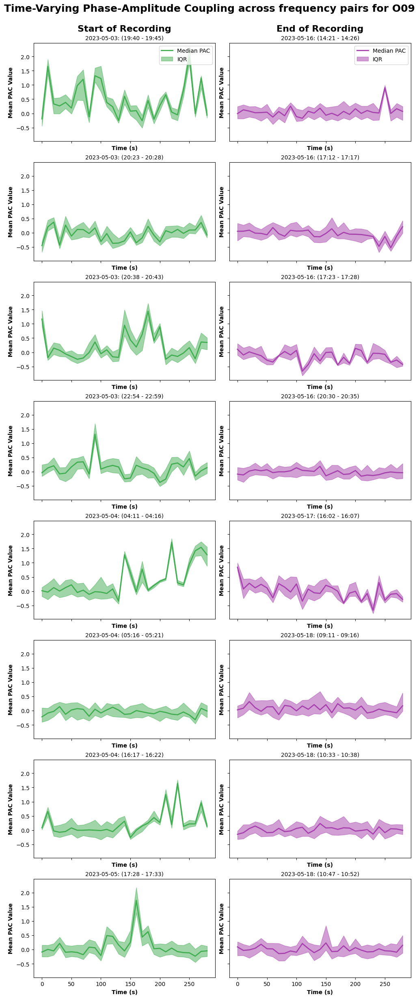

In [ ]:
# Plot time-varying PAC values for each session
# (num sessions x num groups) figure with each subplot being a time series of PAC values for each electrode in each session and group 
# (different colored lines for each electrode, shared x axis across sessions, global y axis, line=median, shaded area=IQR)

fig, axs = plt.subplots(len(session_dict["Start of Recording"]), len(pac_time_data), figsize=(5 * len(pac_time_data), 3 * len(session_dict["Start of Recording"])), constrained_layout=True, sharex=True, sharey=True)
fig.suptitle(f"Time-Varying Phase-Amplitude Coupling across frequency pairs for {organoid_id}", fontsize=18, fontweight="bold", y=1.02)

for group_idx, (name, group_data) in enumerate(pac_time_data.items()):
    for session_idx, (session_title, pac_array) in enumerate(group_data.items()):
        ax = axs[session_idx, group_idx]

        time = np.arange(pac_array.shape[1]) * dt

        median_pac = np.median(pac_array, axis=0)
        q1_pac = np.percentile(pac_array, 25, axis=0)
        q3_pac = np.percentile(pac_array, 75, axis=0)

        ax.plot(time, median_pac, label="Median PAC", color=group_colors[name], linewidth=2)
        ax.fill_between(time, q1_pac, q3_pac, color=group_colors[name], alpha=0.5, label="IQR")

        ax.set_title(session_title, fontsize=10)
        ax.set_xlabel("Time (s)", fontweight="bold")
        ax.set_ylabel("Mean PAC Value", fontweight="bold")
        if session_idx == 0:
            ax.legend(loc="upper right")

# add text annotation of group name at the top of each column
for group_idx, name in enumerate(pac_time_data.keys()):
    axs[0, group_idx].text(0.5, 1.1, name, transform=axs[0, group_idx].transAxes, ha="center", va="bottom", fontsize=16, fontweight="bold")

plt.show()

Preferred Phase

In [ ]:
vec_bins = (analysis.PhaseAmplitudeCoupling.PreferredPhase & session_dict["Start of Recording"][0]).fetch("vecbin")[0]

[2026-03-19 15:31:25,767][WARNING]: Reconnecting to MySQL server.


In [ ]:
# Get average preferred phase across sessions and electrodes for each group
preferred_phase_data = {}

for name, sessions in session_dict.items():

    amplitude_arrays = (analysis.PhaseAmplitudeCoupling.PreferredPhase & sessions).fetch("amplitude_values") # (shape: n_bins, amp_vec, pha_vec, num_epochs)

    # stack amplitude arrays
    amplitude_arrays = np.stack(amplitude_arrays) # shape: num_electrodes*num_sessions, n_bins, amp_vec, pha_vec, num_epochs

    mean_amplitude = np.mean(amplitude_arrays, axis=(0, 4)) # average across electrodes, sessions, and epochs -> shape: n_bins, amp_vec, pha_vec

    preferred_phase_data[name] = mean_amplitude

[2026-03-19 15:40:52,355][WARNING]: Reconnecting to MySQL server.


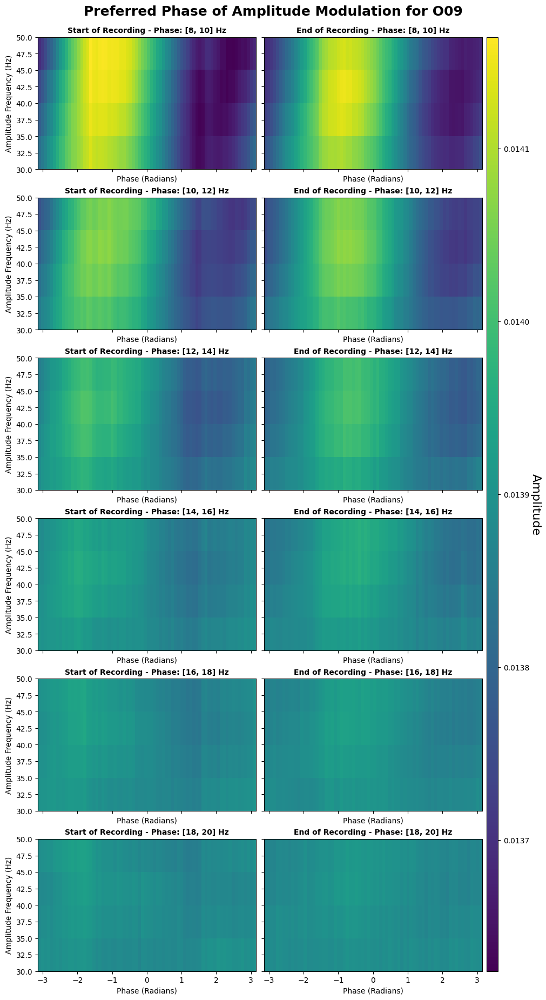

In [ ]:
# Plot preferred phase data
# (pha vec x num groups) figure with each subplot being an image plot (n_bins x amp_vec) of preferred phase values for each phase frequency and group (global colorbar)

fig, axs = plt.subplots(len(f_pha), len(preferred_phase_data), figsize=(5 * len(preferred_phase_data), 3 * len(f_pha)), constrained_layout=True, sharey=True, sharex=True)
fig.suptitle(f"Preferred Phase of Amplitude Modulation for {organoid_id}", fontsize=18, fontweight="bold", y=1.02)

# find global min and max preferred phase values across all groups for color scaling
all_preferred_phase_values = np.concatenate([data.flatten() for data in preferred_phase_data.values()])
vmin = np.min(all_preferred_phase_values)
vmax = np.max(all_preferred_phase_values)

for group_idx, (name, preferred_phase_array) in enumerate(preferred_phase_data.items()):
    for pha_idx, phase_band in enumerate(f_pha):

        ax = axs[pha_idx, group_idx]
        im = ax.imshow(preferred_phase_array[:, :, pha_idx].T, vmin=vmin, vmax=vmax, cmap="viridis", aspect="auto", origin="lower", extent=[vec_bins[0], vec_bins[-1], f_amp[0][0], f_amp[-1][1]])

        ax.set_title(f"{name} - Phase: {phase_band} Hz", fontsize=10, fontweight="bold")
        ax.set_xlabel("Phase (Radians)")

        if group_idx == 0:
            ax.set_ylabel("Amplitude Frequency (Hz)")

# add colorbar
cbar = fig.colorbar(im, ax=axs, orientation="vertical", pad=.01, aspect=80)
cbar.set_label("Amplitude", rotation=270, labelpad=15, fontsize=16)

plt.show()

In [ ]:
# Get time varying preferred phase across sessions 
time_varying_preferred_phase_data = {}

for name, sessions in session_dict.items():